In [3]:
from datetime import datetime
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

In [4]:
sns.set()

# Tech companies

In [5]:
tech_data = pd.DataFrame()

In [6]:
# Vietnam stock information crawling
# https://github.com/thinh-vu/vnstock

!pip install vnstock

from vnstock import *### Split the dataset into time windows to get data samples.  

lstTech = []

tech_tickers = ['CKV', 'CMG', 'CMT', 'ICT', 'ELC', 'FPT', 'HIG', 'HPT', 'ITD', 'KST', 
                'LTC', 'ONE', 'PMJ', 'PMT', 'POT', 'SAM', 'SBD', 'SGT', 'SMT', 'SRA', 
                'SRB', 'ST8', 'TST', 'UNI', 'VAT', 'VEC', 'VIE', 'VLA', 'VTC', 'VTE']

for comp in tech_tickers:
    tech_data = stock_historical_data(comp, "2018-01-01", "2023-05-24")   
    lstTech.append(tech_data)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [7]:
lstTech[0]

,Open,High,Low,Close,Volume,TradingDate
0,11805.0,11805.0,11805.0,11805.0,0,2018-01-02
1,11805.0,11805.0,11805.0,11805.0,0,2018-01-03
2,11805.0,11805.0,11805.0,11805.0,0,2018-01-04
3,11805.0,11805.0,11805.0,11805.0,0,2018-01-05
4,11805.0,11805.0,11805.0,11805.0,0,2018-01-08
...,...,...,...,...,...,...
1340,12449.0,12633.0,12449.0,12633.0,2000,2023-05-18
1341,12541.0,12541.0,12358.0,12358.0,200,2023-05-19
1342,11900.0,11900.0,11900.0,11900.0,600,2023-05-22
1343,11900.0,11900.0,11900.0,11900.0,1100,2023-05-23


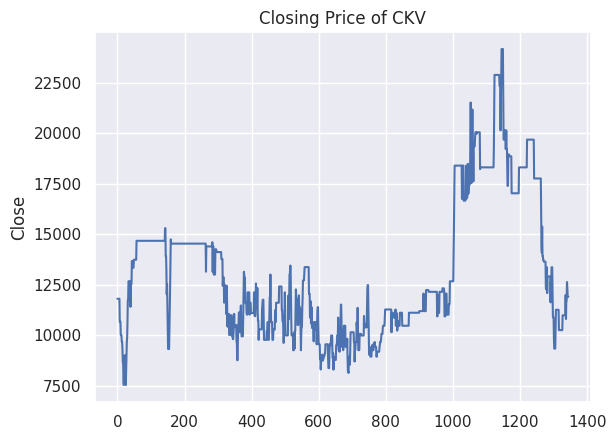

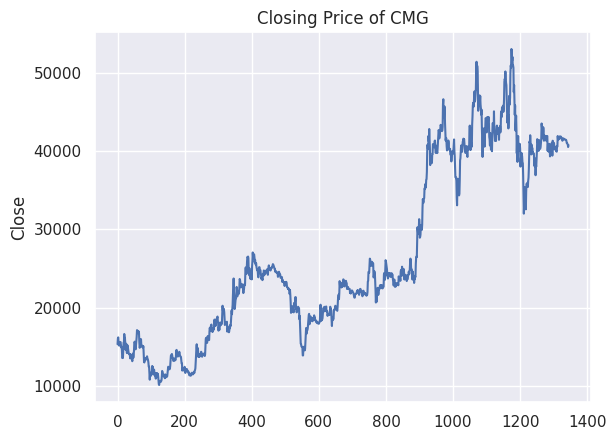

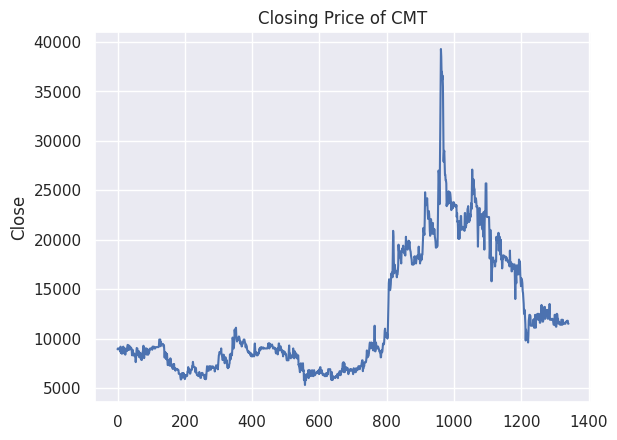

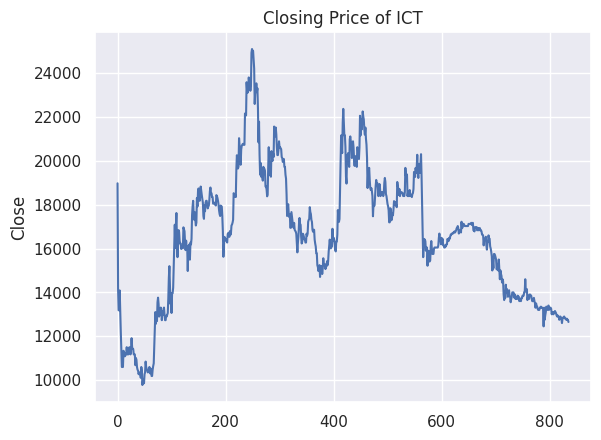

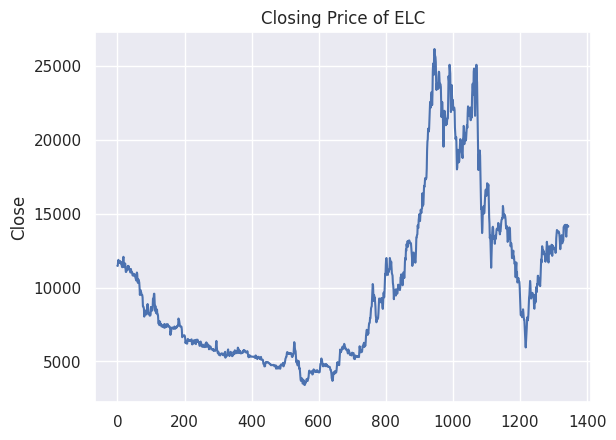

...

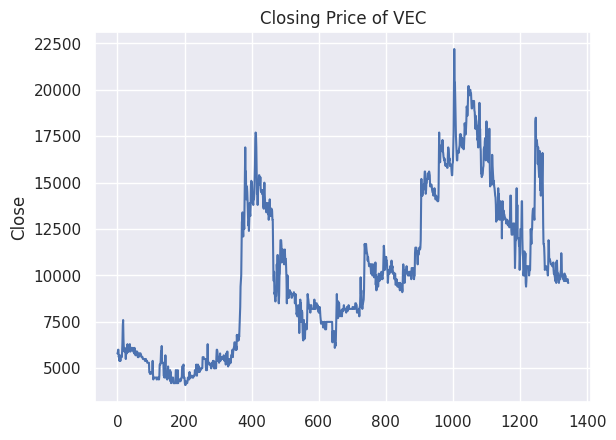

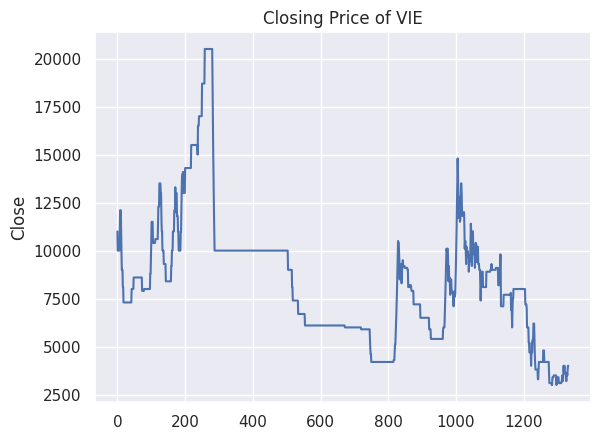

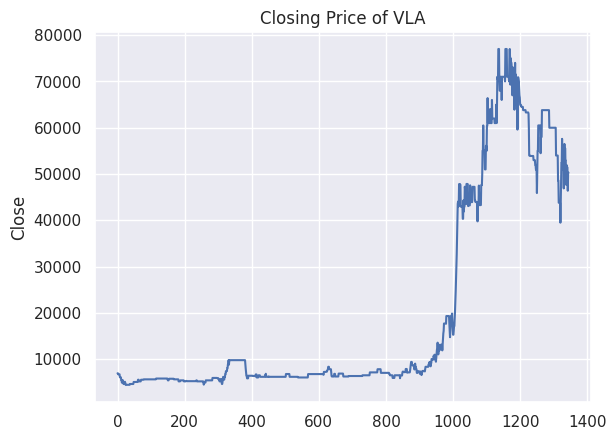

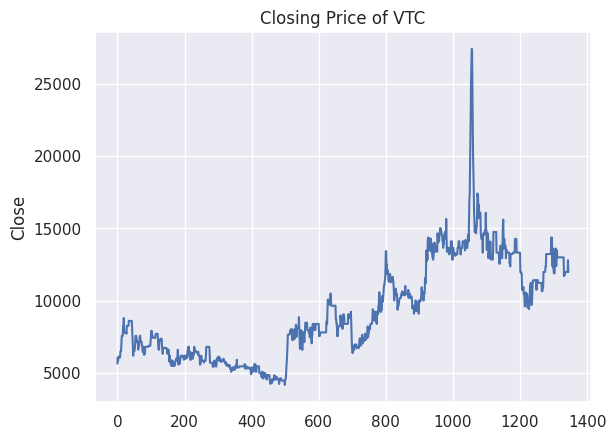

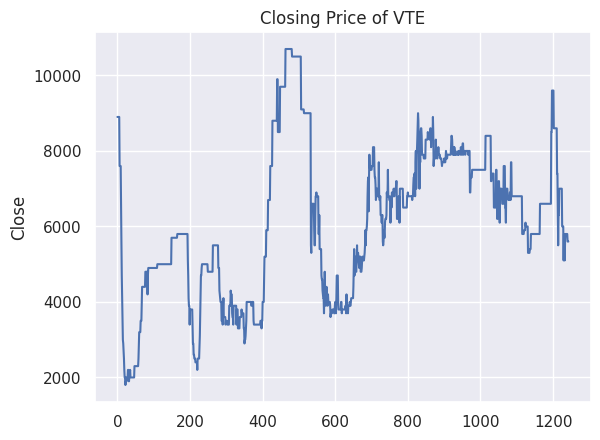

<Figure size 640x480 with 0 Axes>

In [8]:
# Let's see a historical view of the closing price

# plt.subplots_adjust(top=1.25, bottom=1.2)
for i, company in enumerate(lstTech):
    company['Close'].plot()
    plt.ylabel('Close')
    plt.xlabel(None)
    plt.title(f"Closing Price of {tech_tickers[i]}")
    plt.show()
  
plt.tight_layout()

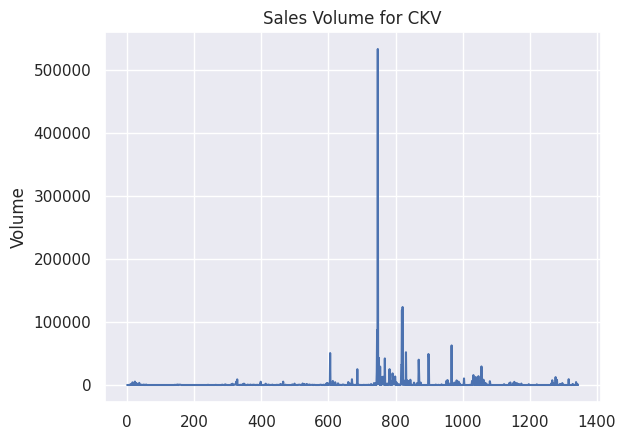

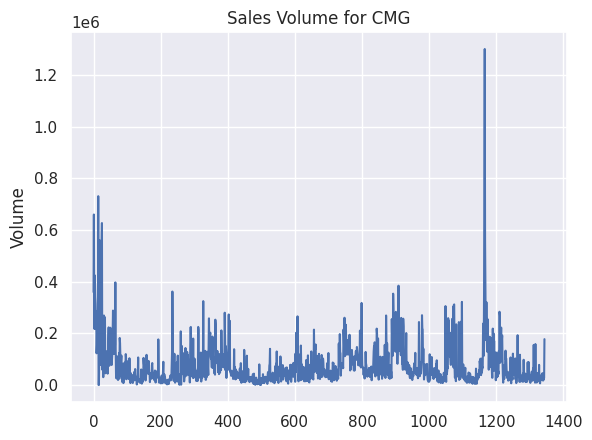

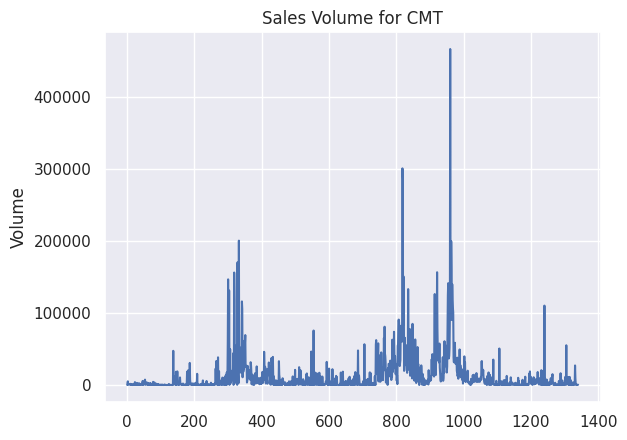

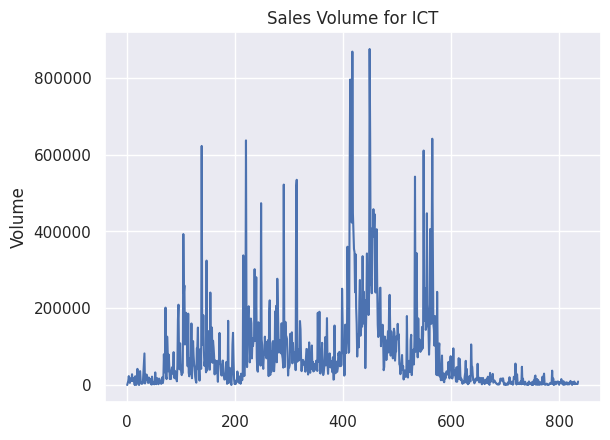

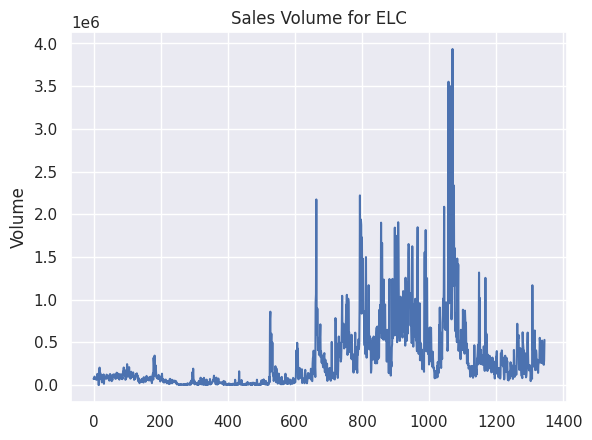

...

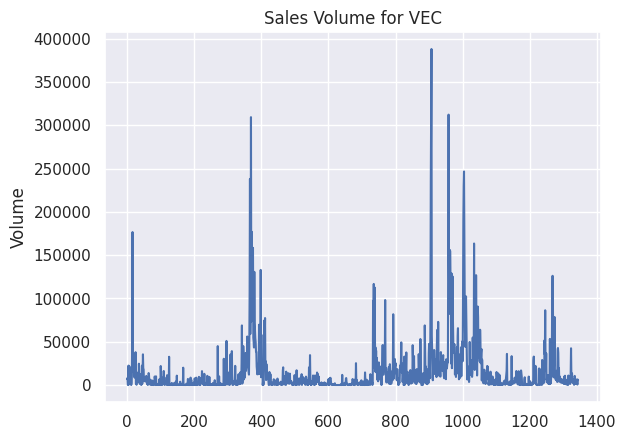

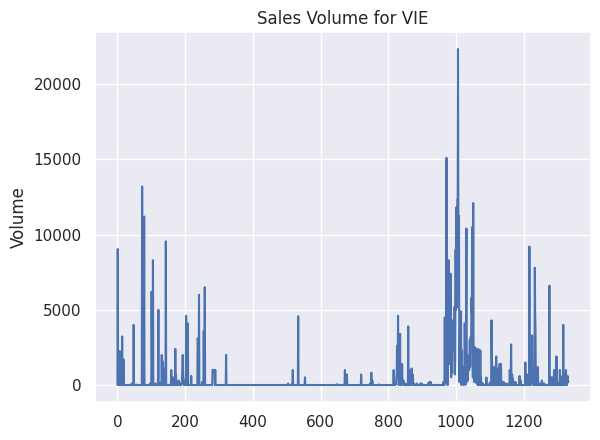

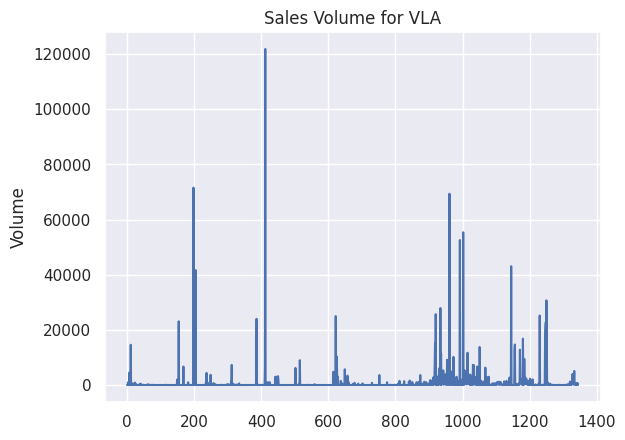

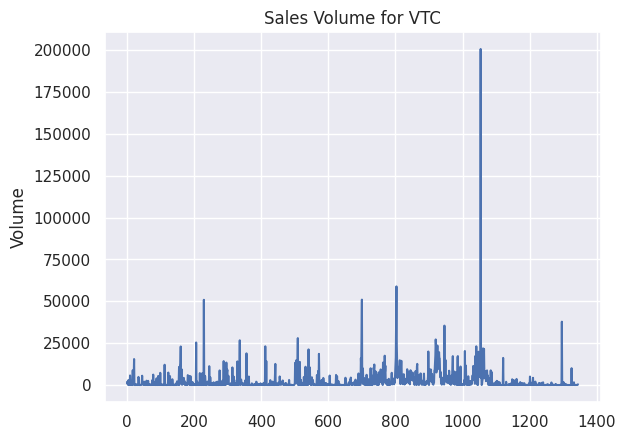

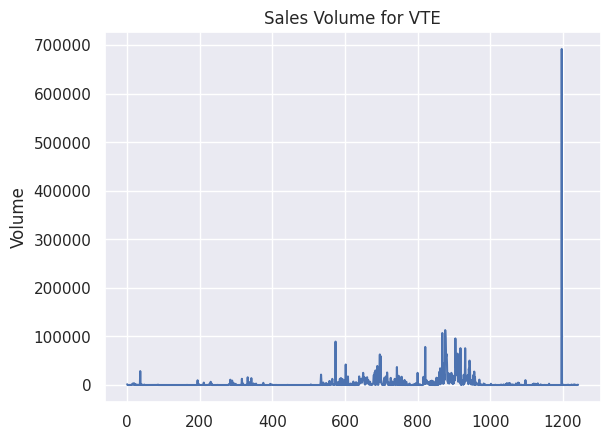

<Figure size 640x480 with 0 Axes>

In [9]:
# Let's see a historical view of the closing price

# plt.subplots_adjust(top=1.25, bottom=1.2)
for i, company in enumerate(lstTech):
    company['Volume'].plot()
    plt.ylabel('Volume')
    plt.xlabel(None)
    plt.title(f"Sales Volume for {tech_tickers[i]}")
    plt.show()
  
plt.tight_layout()

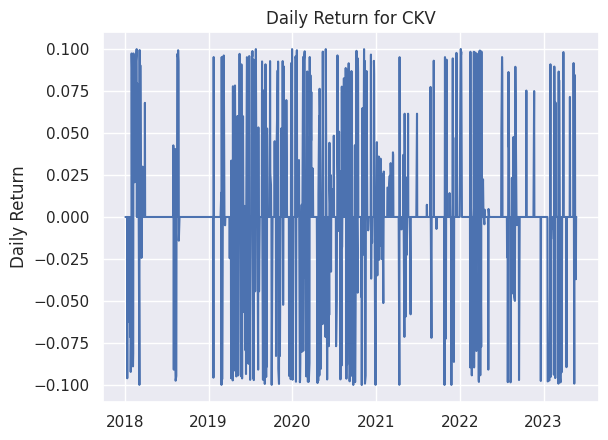

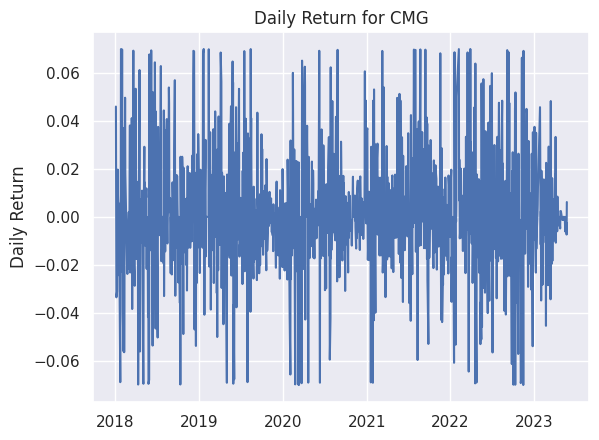

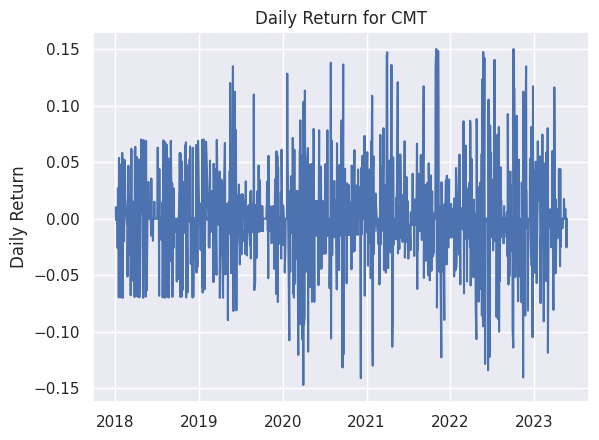

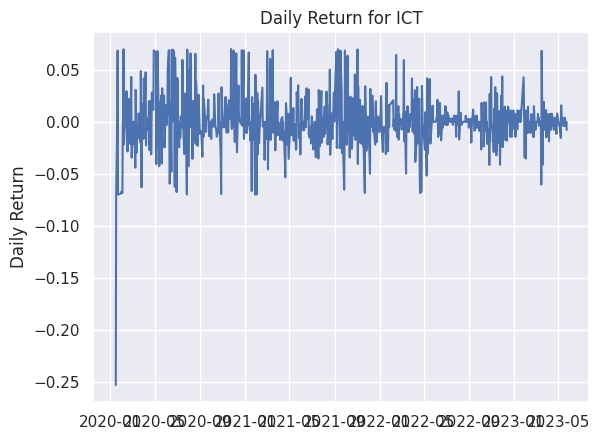

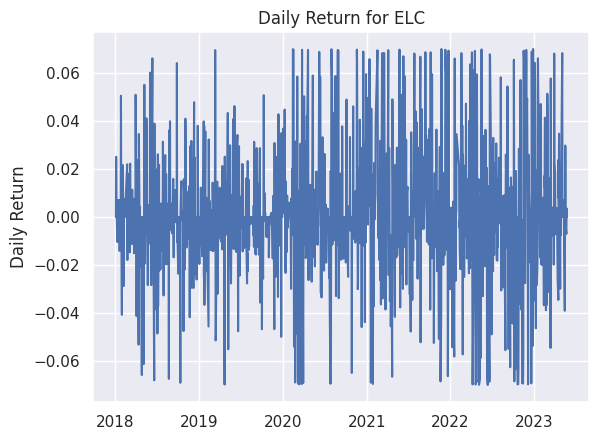

...

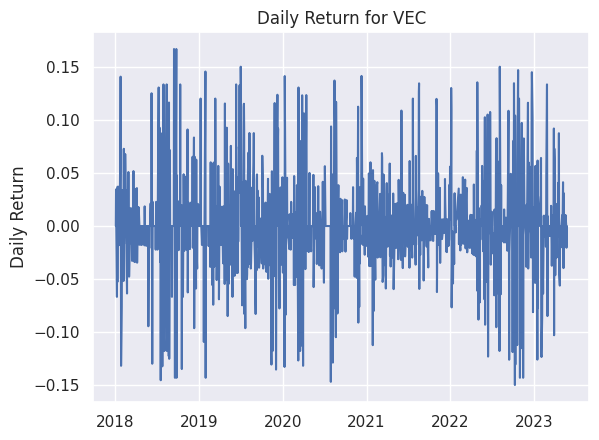

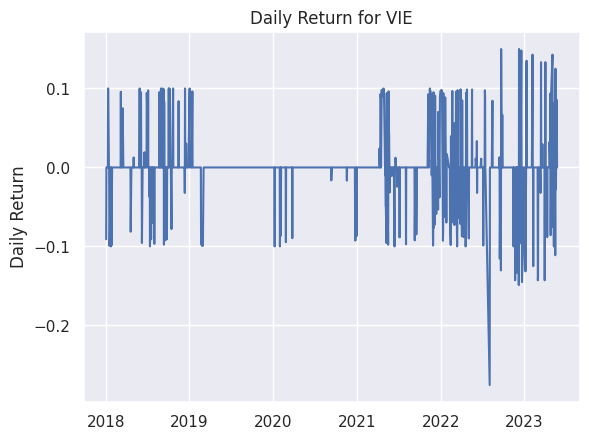

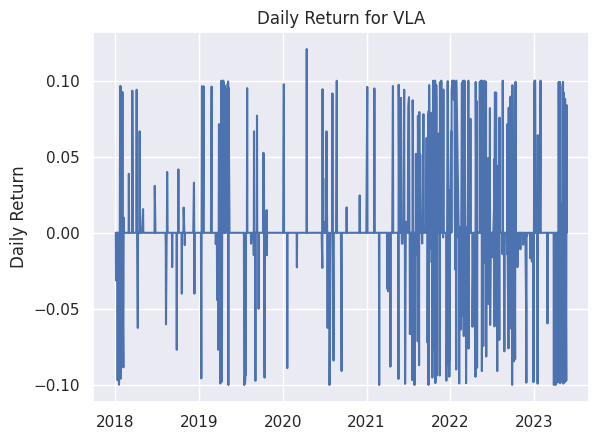

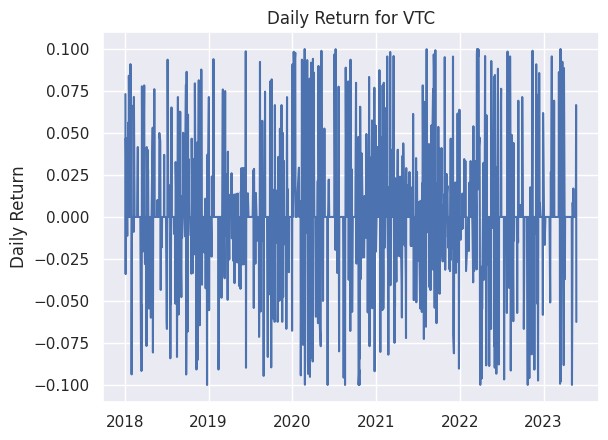

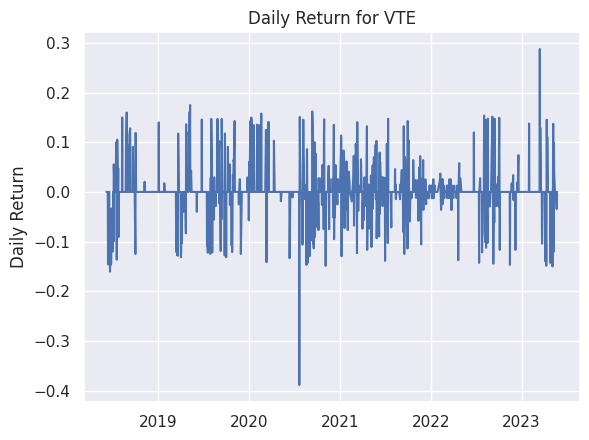

In [10]:
# We'll use pct_change to find the percent change for each day
for i,company in enumerate(lstTech):
    company['Daily Return'] = company['Close'].pct_change()
    plt.plot(company["TradingDate"], company["Daily Return"])
    plt.ylabel('Daily Return')
    plt.xlabel(None)
    plt.title(f"Daily Return for {tech_tickers[i]}")
    plt.show()

<ipython-input-11-0958706ccb0f>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


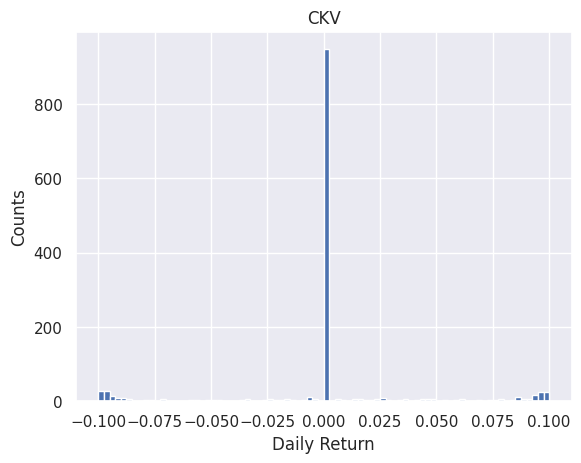

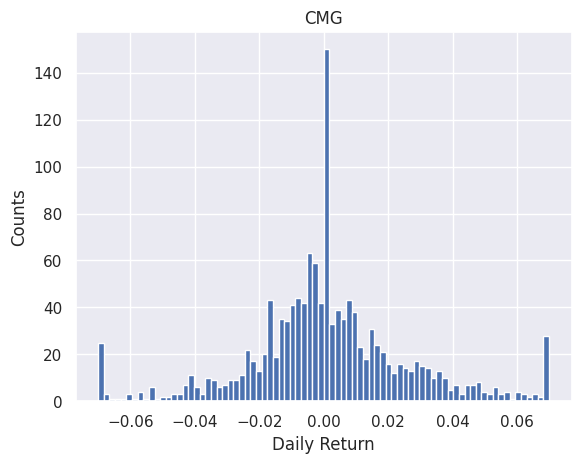

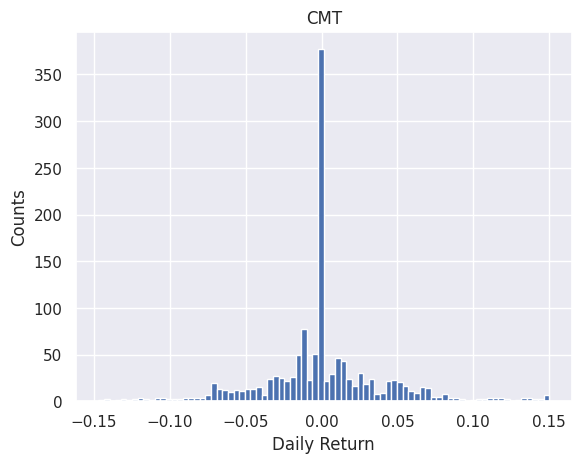

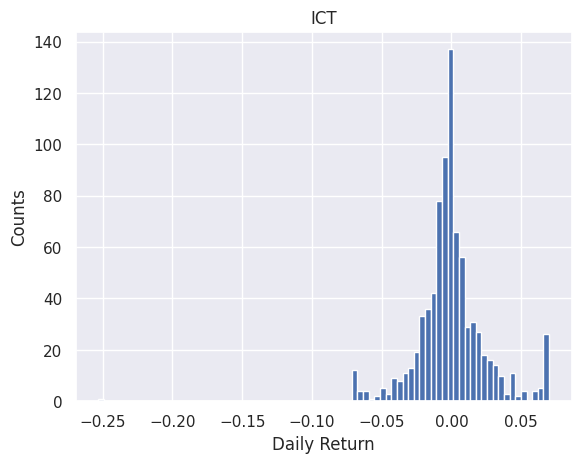

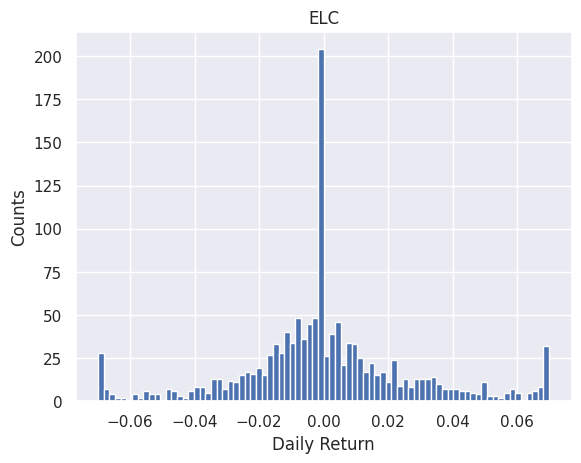

...

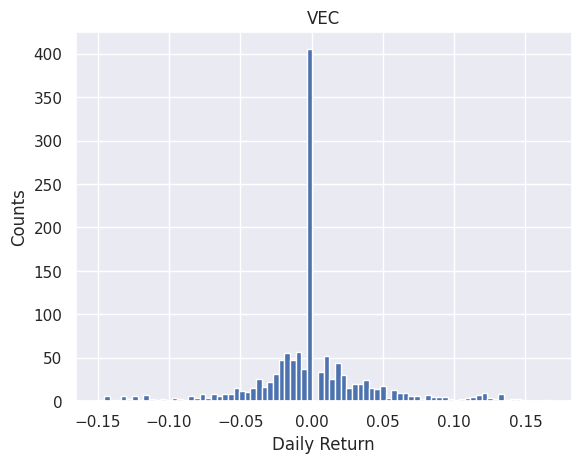

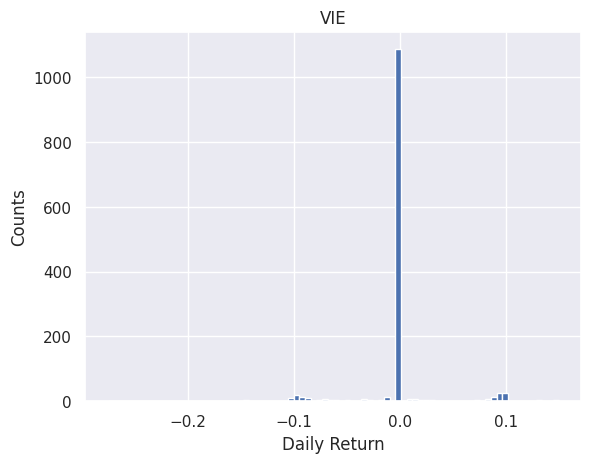

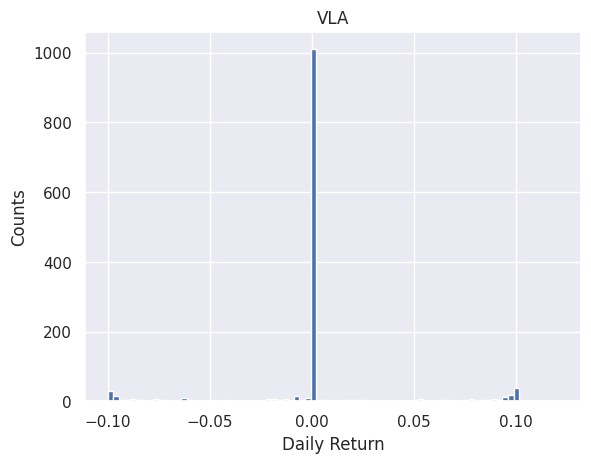

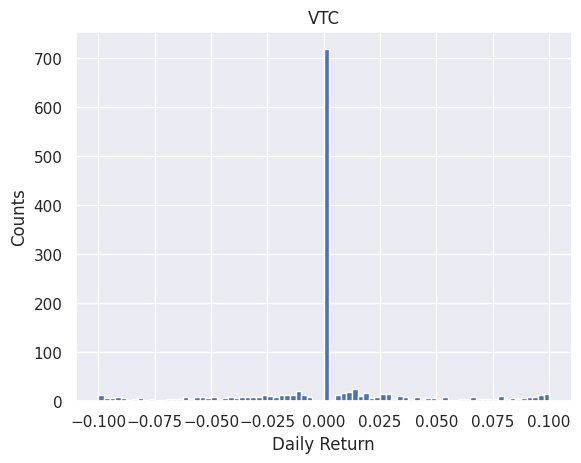

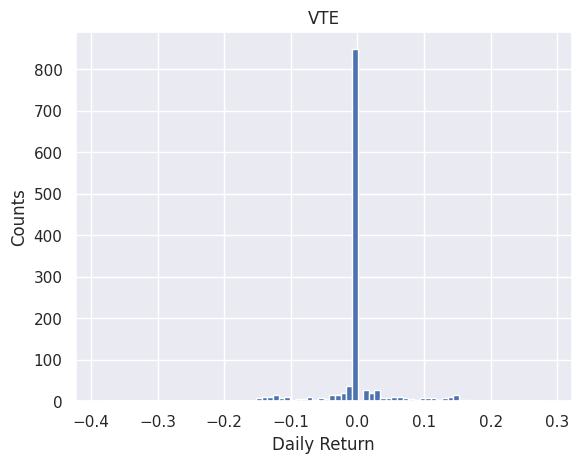

In [11]:
for i, company in enumerate(lstTech):
    plt.figure()
    company['Daily Return'].hist(bins=80)
    plt.xlabel('Daily Return')
    plt.ylabel('Counts')
    plt.title(f'{tech_tickers[i]}')

In [12]:
tech_dr = []
for comp in lstTech:
  tech_dr.append(comp["Daily Return"])
techDR = pd.concat(tech_dr, axis = 1)
techDR.columns = tech_tickers
techDR

,CKV,CMG,CMT,ICT,ELC,FPT,HIG,HPT,ITD,KST,...,SRB,ST8,TST,UNI,VAT,VEC,VIE,VLA,VTC,VTE
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.000000,0.045931,0.010100,-0.253228,0.000000,0.000000,0.000000,0.023256,0.014129,0.000000,...,0.000000,-0.034964,0.0,-0.016667,0.085714,0.000000,-0.090909,0.000000,0.073175,0.0
2,0.000000,0.010153,-0.001000,-0.069584,0.025024,0.020076,-0.018519,0.000000,0.017447,0.000000,...,0.000000,0.036231,0.0,0.016949,0.026316,0.034483,0.000000,-0.031241,-0.034010,0.0
3,0.000000,-0.033483,0.001001,0.000000,0.010463,-0.016369,0.018868,0.000000,-0.030841,0.000000,...,0.000000,-0.004955,0.0,0.000000,-0.051282,0.000000,0.000000,0.000000,0.047001,0.0
4,0.000000,-0.031134,-0.002000,0.068568,-0.006903,0.014977,0.037037,0.000000,0.003437,0.000000,...,-0.066667,-0.010053,0.0,0.083333,0.027027,-0.066667,0.000000,0.000000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1340,0.078177,0.000000,0.000000,NaN,0.028881,0.017178,0.000000,-0.133333,0.053279,0.000000,...,0.100000,0.068966,NaN,0.000000,NaN,0.000000,NaN,-0.009634,0.000000,NaN
1341,-0.021768,-0.002439,NaN,NaN,-0.003509,-0.001206,-0.026667,0.000000,-0.035019,0.000000,...,-0.045455,0.069892,NaN,0.010870,NaN,0.010309,NaN,0.000000,0.000000,NaN
1342,-0.037061,-0.002445,NaN,NaN,-0.007042,-0.003623,-0.054795,0.000000,0.012097,0.000000,...,-0.047619,0.017588,NaN,0.043011,NaN,0.000000,NaN,-0.097276,0.000000,NaN
1343,0.000000,-0.007353,NaN,NaN,0.003546,-0.006061,0.043478,0.061538,-0.035857,-0.098592,...,0.000000,0.069136,NaN,-0.072165,NaN,-0.020408,NaN,0.084052,0.066667,NaN


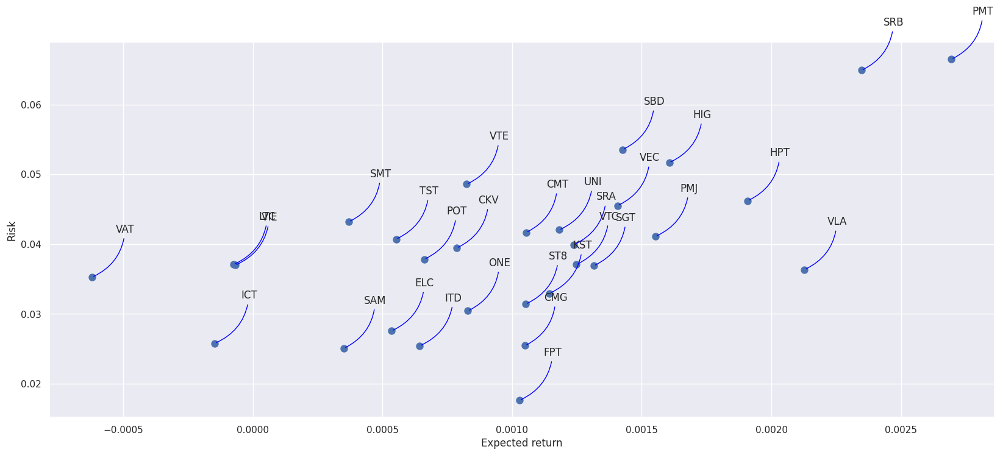

In [13]:
area = np.pi * 20

plt.figure(figsize=(20, 8))
plt.scatter(techDR.mean(), techDR.std(), s=area)
plt.xlabel('Expected return')
plt.ylabel('Risk')

for label, x, y in zip(techDR.columns, techDR.mean(), techDR.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))

# Banks

In [14]:
# Vietnam stock information crawling
# https://github.com/thinh-vu/vnstock

!pip install vnstock

from vnstock import *### Split the dataset into time windows to get data samples.  

lstbank = []

bank_tickers = ['ABB', 'ACB', 'BID', 'CTG', 'EIB', 'BVB', 'HDB', 'KLB', 'LPB', 
                'MBB', 'MSB', 'NAB', 'BAB', 'NVB', 'OCB', 'PGB', 'SSB', 'SGB', 
                'SHB', 'STB', 'TCB', 'TPB', 'VAB', 'VCB', 'VIB', 'VPB', 'VBB']


for comp in bank_tickers:
    bank_data = stock_historical_data(comp, "2018-01-01", "2023-05-24")   
    lstbank.append(bank_data)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [15]:
lstbank[0]

,Open,High,Low,Close,Volume,TradingDate
0,9436.0,9740.0,8096.0,8500.0,3124600,2020-12-28
1,8401.0,8583.0,8218.0,8400.0,1886191,2020-12-29
2,8462.0,8522.0,8218.0,8300.0,1396514,2020-12-30
3,8279.0,8279.0,8096.0,8200.0,1188032,2020-12-31
4,8218.0,8279.0,7975.0,8100.0,1668474,2021-01-04
...,...,...,...,...,...,...
592,9100.0,9200.0,9000.0,9100.0,973351,2023-05-18
593,9200.0,9200.0,8800.0,8900.0,3328652,2023-05-19
594,9000.0,9100.0,8800.0,8900.0,2033613,2023-05-22
595,9000.0,9200.0,9000.0,9100.0,2155444,2023-05-23


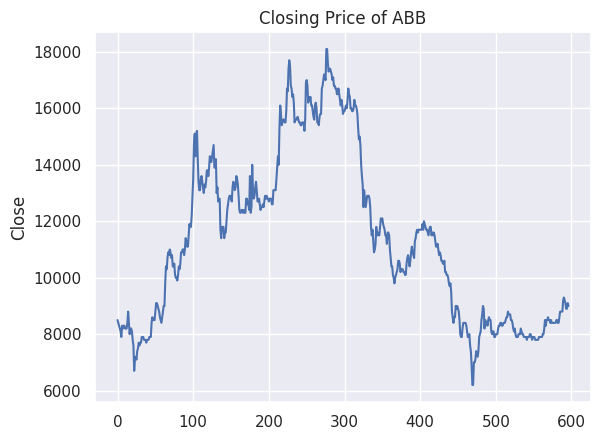

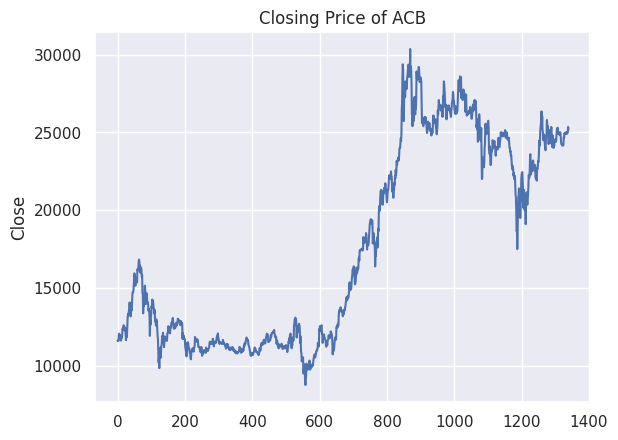

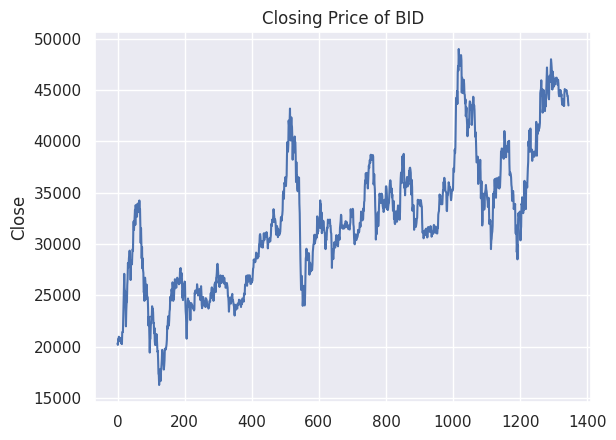

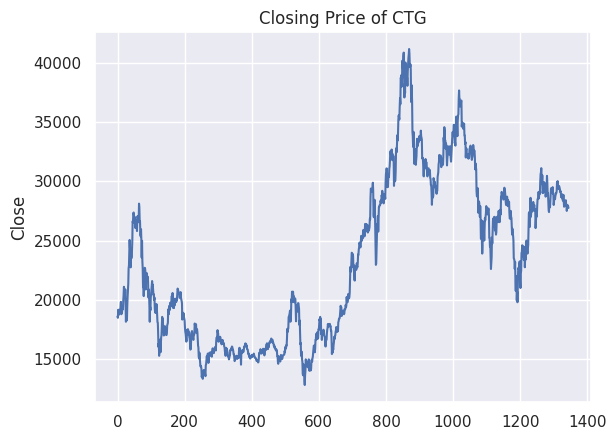

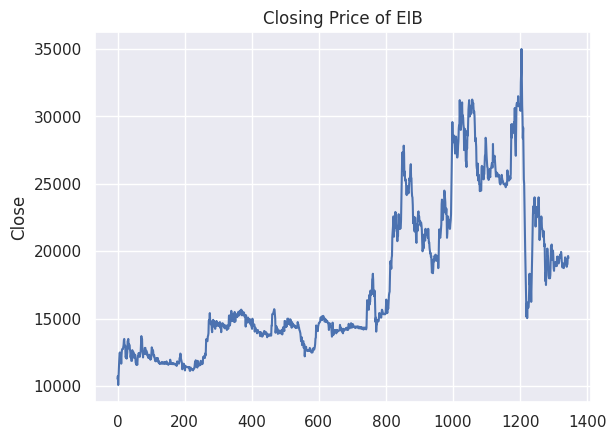

...

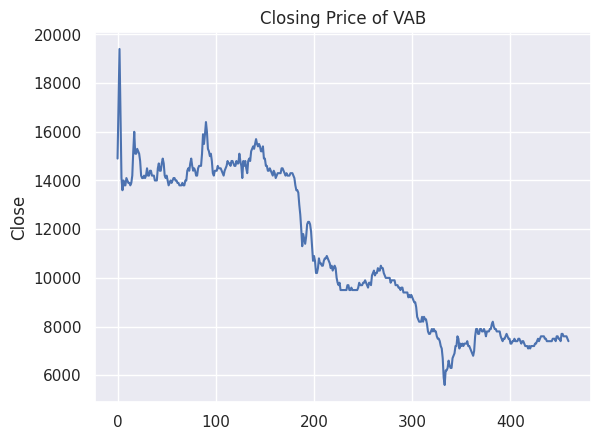

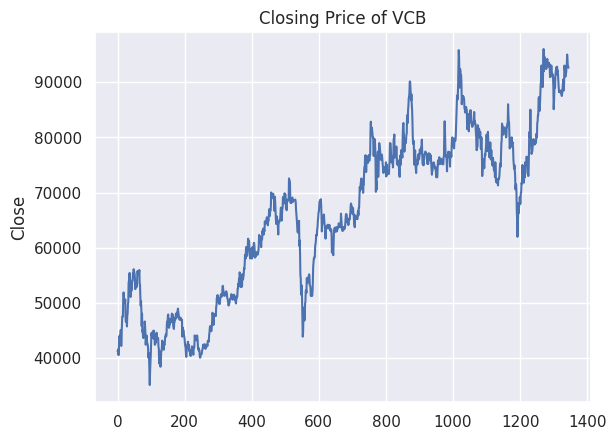

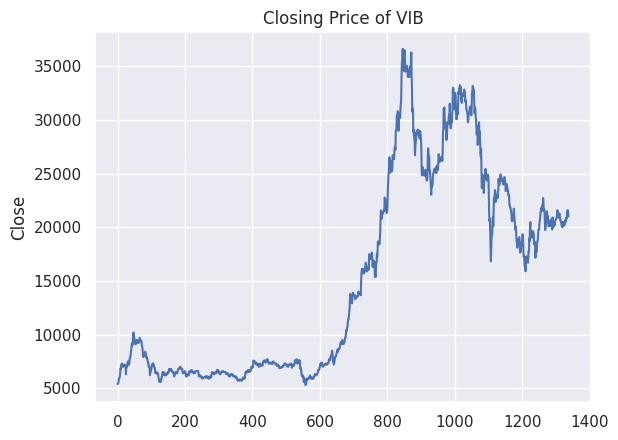

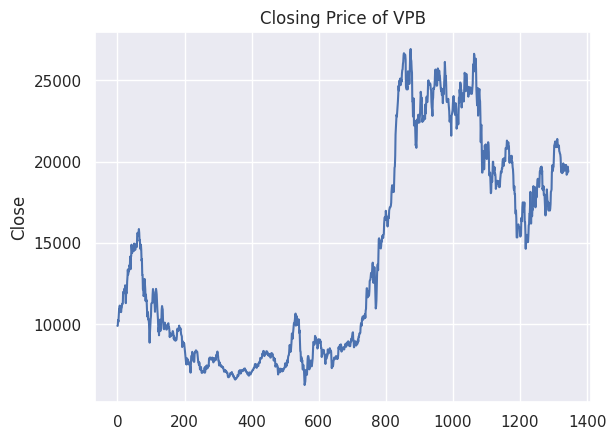

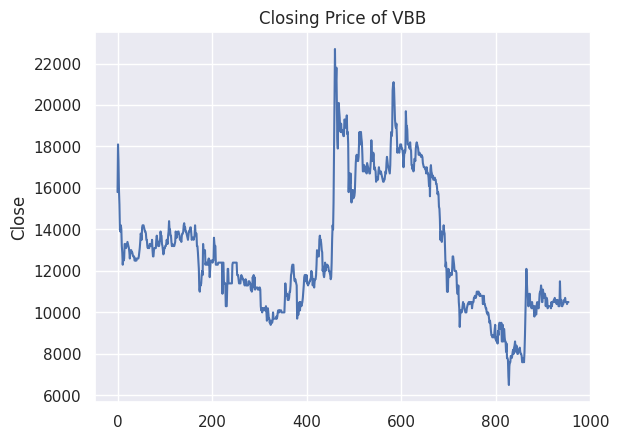

<Figure size 640x480 with 0 Axes>

In [16]:
# Let's see a historical view of the closing price

# plt.subplots_adjust(top=1.25, bottom=1.2)
for i, company in enumerate(lstbank):
    company['Close'].plot()
    plt.ylabel('Close')
    plt.xlabel(None)
    plt.title(f"Closing Price of {bank_tickers[i]}")
    plt.show()
  
plt.tight_layout()

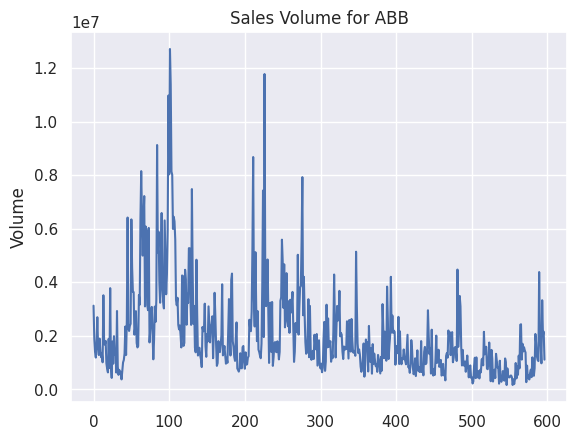

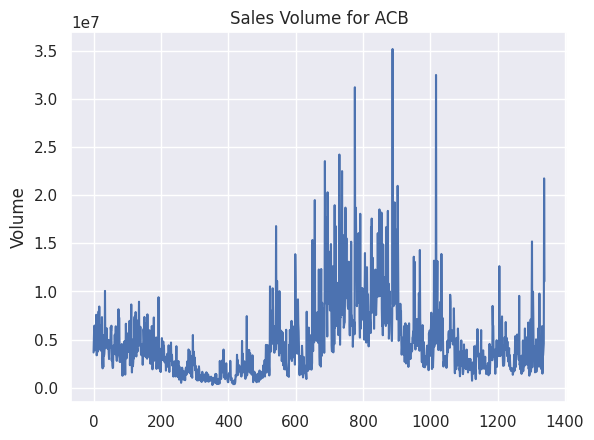

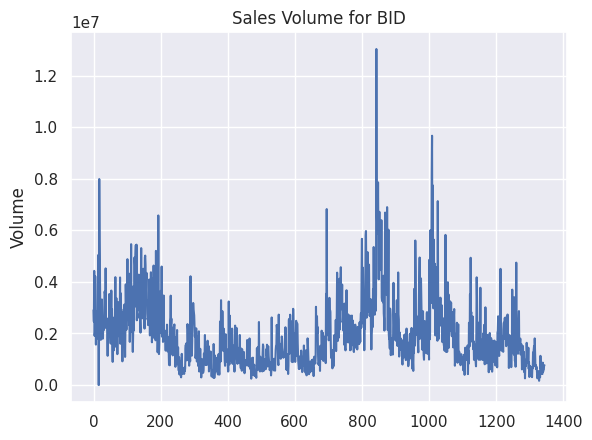

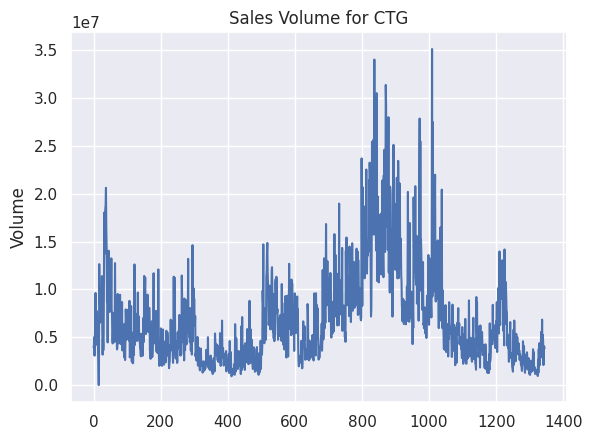

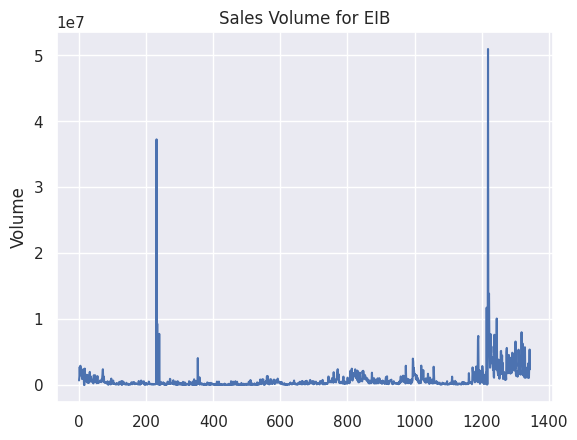

...

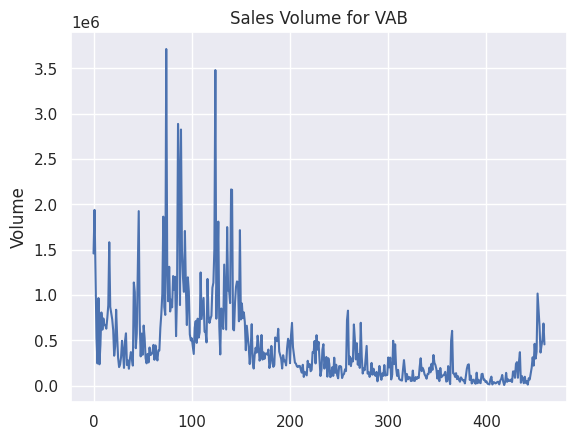

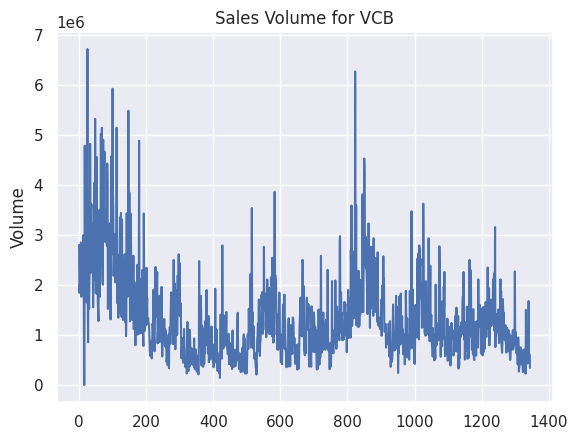

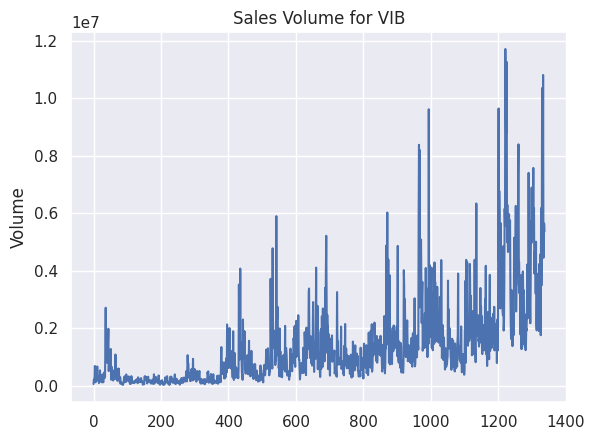

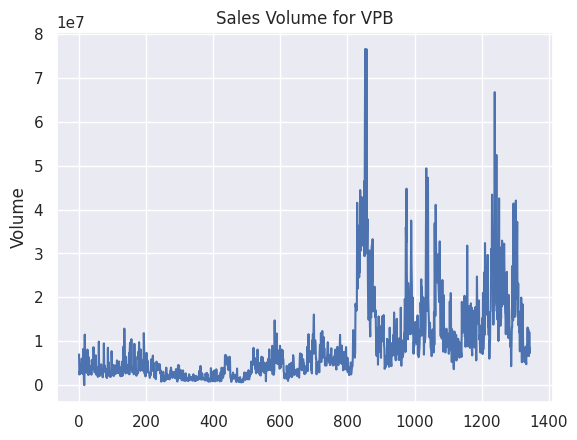

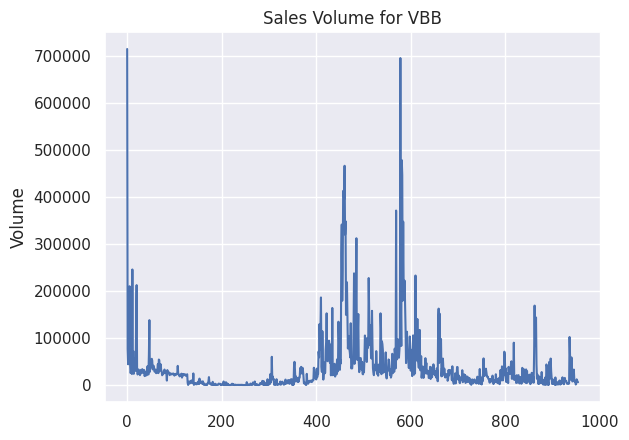

<Figure size 640x480 with 0 Axes>

In [17]:
# Let's see a historical view of the closing price

# plt.subplots_adjust(top=1.25, bottom=1.2)
for i, company in enumerate(lstbank):
    company['Volume'].plot()
    plt.ylabel('Volume')
    plt.xlabel(None)
    plt.title(f"Sales Volume for {bank_tickers[i]}")
    plt.show()
  
plt.tight_layout()

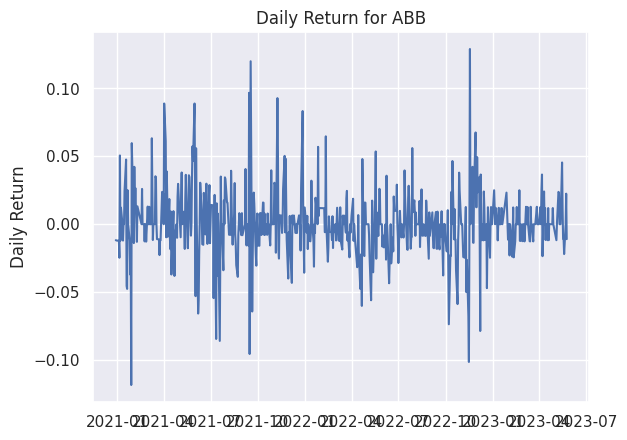

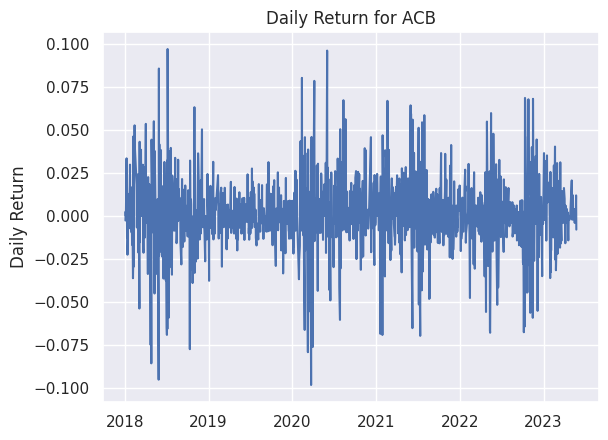

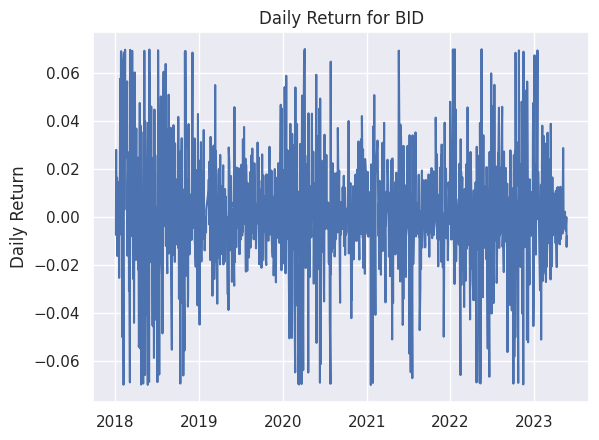

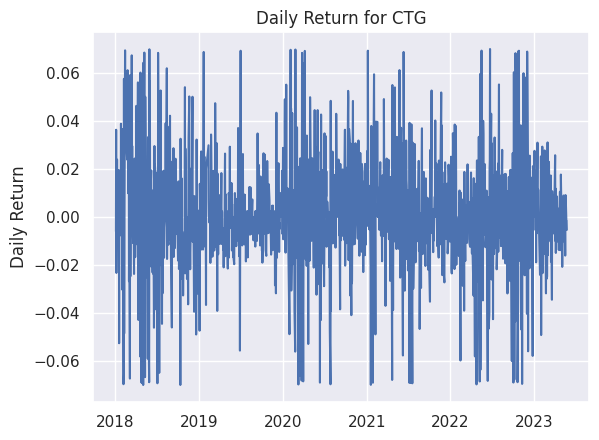

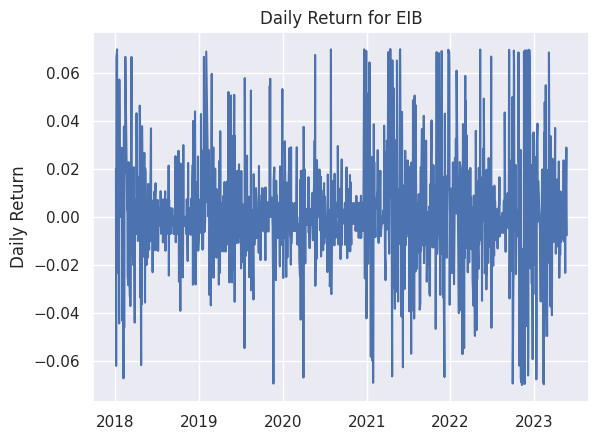

...

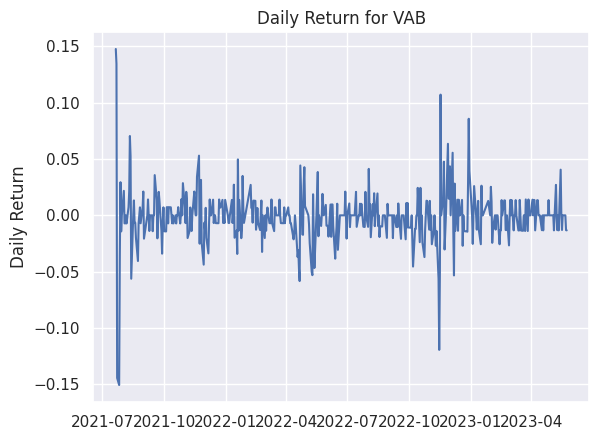

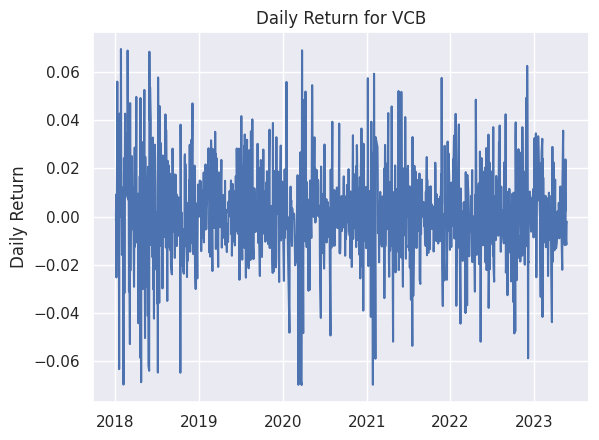

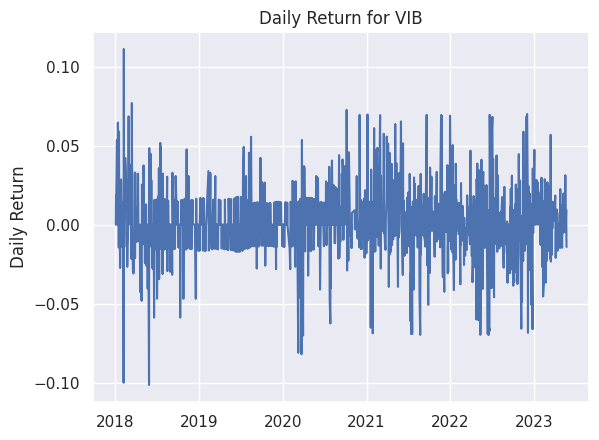

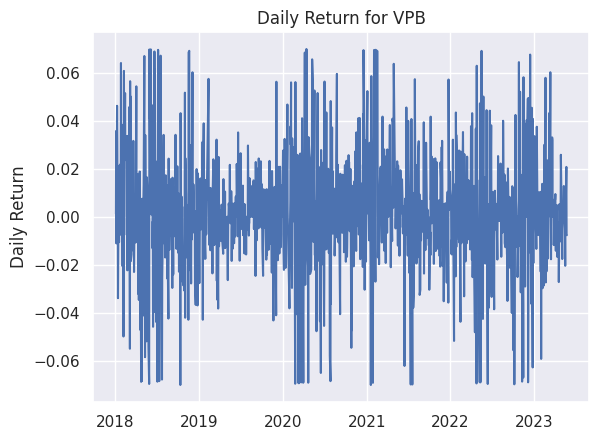

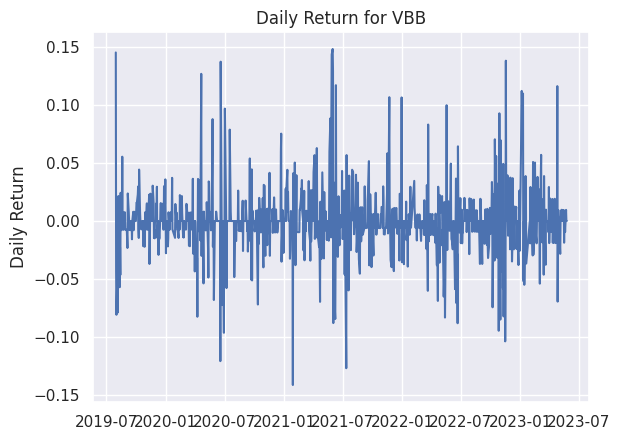

In [18]:
# We'll use pct_change to find the percent change for each day
for i,company in enumerate(lstbank):
    company['Daily Return'] = company['Close'].pct_change()
    plt.plot(company["TradingDate"], company["Daily Return"])
    plt.ylabel('Daily Return')
    plt.xlabel(None)
    plt.title(f"Daily Return for {bank_tickers[i]}")
    plt.show()

<ipython-input-19-e5fb3407790c>:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


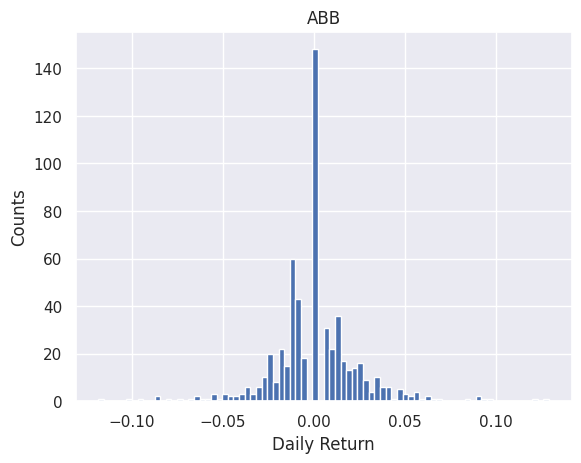

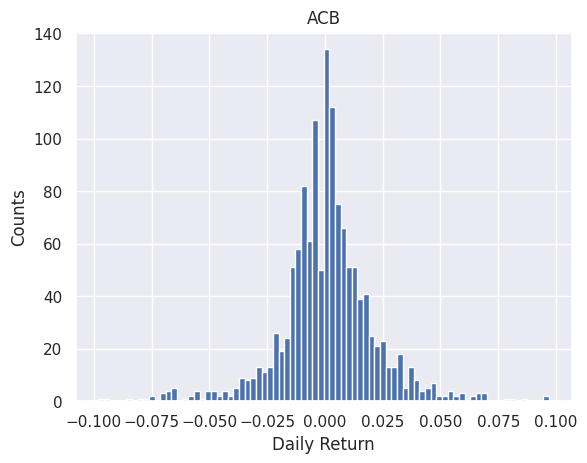

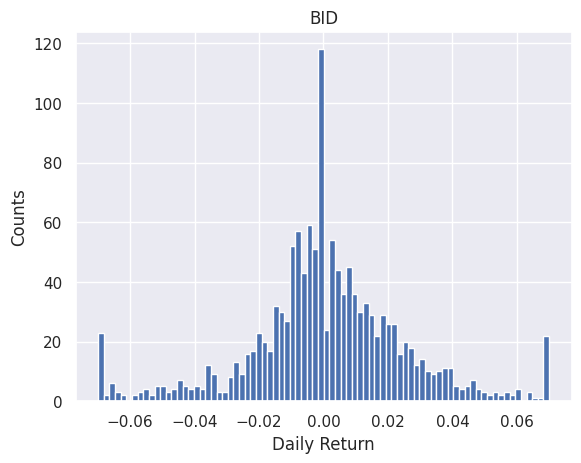

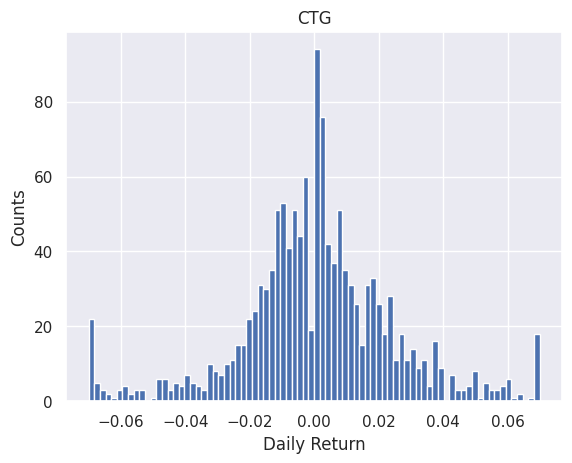

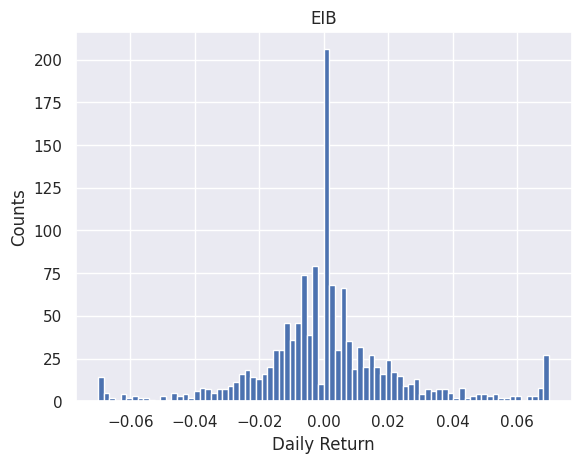

...

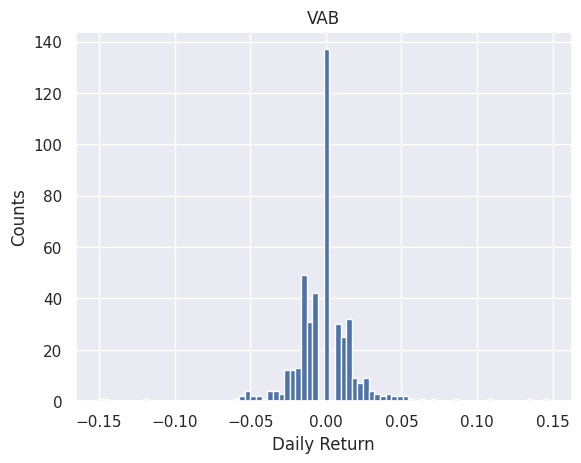

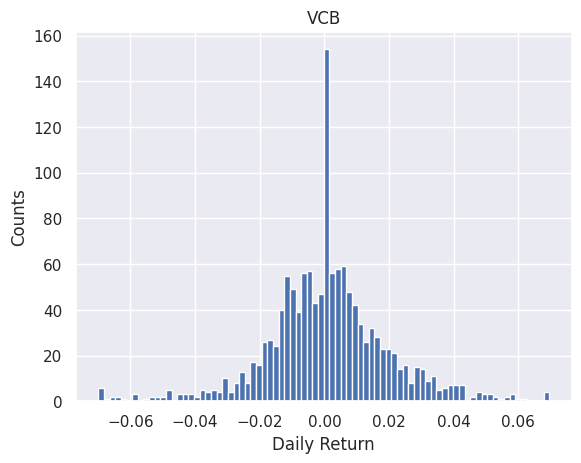

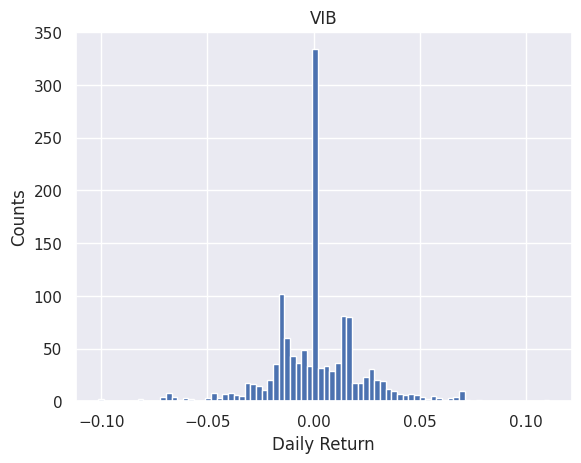

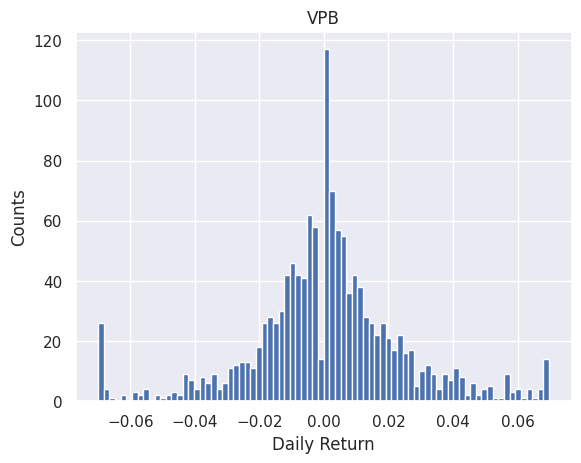

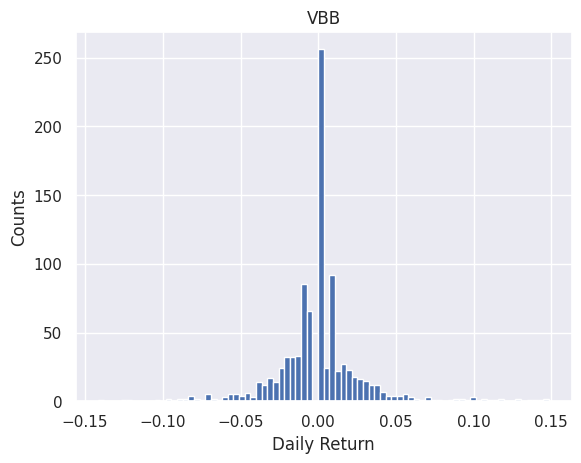

In [19]:
for i, company in enumerate(lstbank):
    plt.figure()
    company['Daily Return'].hist(bins=80)
    plt.xlabel('Daily Return')
    plt.ylabel('Counts')
    plt.title(f'{bank_tickers[i]}')

In [20]:
bank_dr = []
for comp in lstbank:
  bank_dr.append(comp["Daily Return"])
bankDR = pd.concat(bank_dr, axis = 1)
bankDR.columns = bank_tickers
bankDR

,ABB,ACB,BID,CTG,EIB,BVB,HDB,KLB,LPB,MBB,...,SGB,SHB,STB,TCB,TPB,VAB,VCB,VIB,VPB,VBB
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,-0.011765,-0.002583,-0.007384,-0.006021,0.019827,0.145299,0.002549,0.023810,0.029412,-0.009368,...,-0.125714,0.000000,-0.003731,-0.062496,0.001517,0.147651,-0.001815,0.000000,0.001211,0.145570
2,-0.011905,0.002590,0.027969,0.036288,-0.062047,0.141791,0.001272,0.011628,0.014286,0.001815,...,-0.019608,0.000000,0.018727,-0.041660,-0.052305,0.134503,0.009089,0.018519,0.035671,-0.044199
3,-0.012048,0.000000,-0.005451,-0.023327,0.066151,-0.130719,0.013819,0.000000,-0.014085,-0.007532,...,-0.100000,-0.020328,0.000000,0.069560,0.000000,-0.144330,-0.025268,0.018182,-0.011092,-0.080925
4,-0.012195,0.033491,0.016444,0.023885,0.069767,-0.097744,0.054598,0.000000,0.014286,0.049669,...,-0.059259,0.041499,0.069853,0.069092,-0.035703,-0.150602,0.025923,0.053571,0.046143,-0.044025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1340,NaN,NaN,-0.003348,0.009091,0.007958,NaN,0.002571,-0.008696,NaN,0.008130,...,NaN,-0.004167,0.007407,NaN,NaN,NaN,0.023707,NaN,0.002604,NaN
1341,NaN,NaN,-0.005599,0.009009,0.002632,NaN,0.000000,0.008772,NaN,0.002688,...,NaN,-0.008368,0.023897,NaN,NaN,NaN,-0.008421,NaN,0.002597,NaN
1342,NaN,NaN,0.000000,-0.001786,0.028871,NaN,NaN,0.008696,NaN,0.010724,...,NaN,NaN,0.010772,NaN,NaN,NaN,-0.011677,NaN,0.020725,NaN
1343,NaN,NaN,-0.012387,-0.001789,0.002551,NaN,NaN,0.008621,NaN,-0.005305,...,NaN,NaN,-0.007105,NaN,NaN,NaN,-0.003222,NaN,-0.007614,NaN


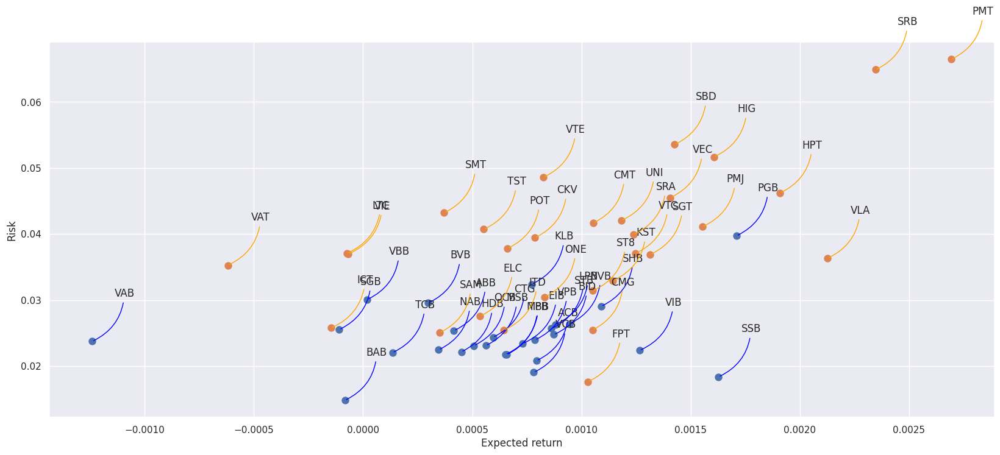

In [21]:
area = np.pi * 20

plt.figure(figsize=(20, 8))
plt.scatter(bankDR.mean(), bankDR.std(), s=area)
plt.scatter(techDR.mean(), techDR.std(), s=area)
plt.xlabel('Expected return')
plt.ylabel('Risk')

for label, x, y in zip(bankDR.columns, bankDR.mean(), bankDR.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))
for label, x, y in zip(techDR.columns, techDR.mean(), techDR.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='orange', connectionstyle='arc3,rad=-0.3'))

# Real Estate

In [22]:
# Vietnam stock information crawling
# https://github.com/thinh-vu/vnstock

!pip install vnstock

from vnstock import *### Split the dataset into time windows to get data samples.  

lstRE = []

RE_tickers = ['BVL', 'SSH', 'BIG', 'MGR', 'AAV', 'AGG', 'AMD', 'API', 'BCM', 
              'BII', 'MH3', 'C21', 'CCL', 'CRE', 'CEO', 'CKG', 'CK8', 'CLG', 
              'D11', 'D2D', 'DIG', 'DRH', 'DTA', 'DXG', 'DXS', 'EFI', 'LEC', 
              'FDC', 'FID', 'FIR', 'FLC', 'HPX', 'HD6', 'HAR', 'XDH', 'HDC', 
              'HDG', 'TCH', 'HPI', 'HIZ', 'HLD', 'DCH', 'HQC', 'HRB', 'HTN', 
              'HD2', 'HU6', 'HD8', 'IDC', 'IDJ', 'IDV', 'IJC', 'ITA', 'ITC', 
              'KAC', 'KBC', 'KDH', 'KHA', 'KHG', 'KOS', 'LSG', 'LDG', 'LGL', 
              'LHG', 'LMH', 'MA1', 'NBB', 'NDN', 'NRC', 'VHM', 'NLG', 'NVL', 
              'NTB', 'NTC', 'NTL', 'NVT', 'PDR', 'PIV', 'PLA', 'PPI', 'KSF', 'PTL', 
              'PTN', 'PV2', 'PXC', 'PVL', 'PVR', 'PWA', 'PXA', 'PXL', 'QCG', 'RCL', 
              'TBR', 'SID', 'SCR', 'SGR', 'SIP', 'SZC', 'SJS', 'SZG', 'STL', 'SZL', 
              'SZB', 'TDC', 'TDH', 'TEG', 'THD', 'TIG', 'TID', 'TIP', 'TIX', 'TLD', 
              'TN1', 'V11', 'V21', 'VC3', 'VCR', 'VIC', 'VHD', 'VGV', 'VNI', 'VPH', 
              'VPI', 'VRC', 'VRG', 'VRE']

for comp in RE_tickers:
    RE_data = stock_historical_data(comp, "2018-01-01", "2023-05-24")   
    lstRE.append(RE_data)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [23]:
lstRE[0]

,Open,High,Low,Close,Volume,TradingDate
0,14500.0,14500.0,14500.0,14500.0,2000,2021-06-11
1,16600.0,16600.0,16600.0,16600.0,2200,2021-06-14
2,19000.0,19000.0,19000.0,19000.0,3000,2021-06-15
3,21800.0,21800.0,21800.0,21800.0,2000,2021-06-16
4,25000.0,25000.0,25000.0,25000.0,4300,2021-06-17
...,...,...,...,...,...,...
482,10000.0,10000.0,10000.0,10000.0,0,2023-05-18
483,10000.0,10000.0,10000.0,10000.0,0,2023-05-19
484,10000.0,10000.0,10000.0,10000.0,900,2023-05-22
485,10000.0,10000.0,10000.0,10000.0,0,2023-05-23


In [24]:
# Let's see a historical view of the closing price

# plt.subplots_adjust(top=1.25, bottom=1.2)
for i, company in enumerate(lstRE):
    company['Close'].plot()
    plt.ylabel('Close')
    plt.xlabel(None)
    plt.title(f"Closing Price of {RE_tickers[i]}")
    plt.show()
  
plt.tight_layout()

Output hidden; open in https://colab.research.google.com to view.

In [25]:
# Let's see a historical view of the closing price

# plt.subplots_adjust(top=1.25, bottom=1.2)
for i, company in enumerate(lstRE):
    company['Volume'].plot()
    plt.ylabel('Volume')
    plt.xlabel(None)
    plt.title(f"Sales Volume for {RE_tickers[i]}")
    plt.show()
  
plt.tight_layout()

Output hidden; open in https://colab.research.google.com to view.

In [26]:
# We'll use pct_change to find the percent change for each day
for i,company in enumerate(lstRE):
    company['Daily Return'] = company['Close'].pct_change()
    plt.plot(company["TradingDate"], company["Daily Return"])
    plt.ylabel('Daily Return')
    plt.xlabel(None)
    plt.title(f"Daily Return for {RE_tickers[i]}")
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [27]:
for i, company in enumerate(lstRE):
    plt.figure()
    company['Daily Return'].hist(bins=80)
    plt.xlabel('Daily Return')
    plt.ylabel('Counts')
    plt.title(f'{RE_tickers[i]}')

Output hidden; open in https://colab.research.google.com to view.

In [28]:
RE_dr = []
for comp in lstRE:
  RE_dr.append(comp["Daily Return"])
REDR = pd.concat(RE_dr, axis = 1)
REDR.columns = RE_tickers
REDR

,BVL,SSH,BIG,MGR,AAV,AGG,AMD,API,BCM,BII,...,VCR,VIC,VHD,VGV,VNI,VPH,VPI,VRC,VRG,VRE
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.144828,0.148325,0.144737,0.150000,0.095023,-0.008212,0.007839,-0.023329,-0.008368,-0.05,...,-0.027027,0.029402,-0.152778,0.000000,0.0,-0.009171,-0.005532,-0.008721,0.117647,0.001065
2,0.144578,0.145833,0.149425,0.149068,-0.046246,-0.021560,-0.004444,0.023886,-0.092827,0.00,...,0.055556,0.006223,0.000000,0.000000,0.0,0.009256,0.000000,-0.008798,0.157895,-0.004204
3,0.147368,0.149091,0.150000,0.145946,0.005992,0.005056,-0.027902,0.000000,-0.055814,0.00,...,-0.026316,-0.012353,0.131148,-0.022727,0.0,0.022744,0.002759,0.011834,0.151515,-0.004249
4,0.146789,0.148734,0.147826,-0.122642,0.006048,0.006779,-0.024110,-0.006709,0.009852,0.00,...,0.000000,0.003744,0.000000,-0.034884,0.0,0.017755,0.000000,-0.002924,0.078947,-0.012773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1340,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.007246,NaN,NaN,...,NaN,0.000000,0.000000,0.000000,0.0,0.000000,NaN,0.001176,-0.050926,0.007168
1341,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.014388,NaN,NaN,...,NaN,-0.013158,-0.010526,0.010870,0.0,-0.003984,NaN,0.000000,-0.004878,-0.003559
1342,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.028369,NaN,NaN,...,NaN,-0.007619,0.021277,-0.010753,0.0,0.000000,NaN,0.008226,0.098039,-0.003571
1343,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.013793,NaN,NaN,...,NaN,0.009597,0.104167,0.000000,0.0,0.026000,NaN,0.002331,0.022321,-0.007168


In [29]:
REDR.dropna(axis=1, thresh=REDR.shape[0]-3, inplace=True)

In [30]:
REDR

,AMD,API,MH3,C21,CCL,CEO,D11,D2D,DIG,DRH,...,V21,VC3,VIC,VHD,VGV,VNI,VPH,VRC,VRG,VRE
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.007839,-0.023329,0.00000,0.000000,0.010234,0.000000,-0.015184,0.023614,0.038430,-0.010386,...,0.000000,0.011488,0.029402,-0.152778,0.000000,0.0,-0.009171,-0.008721,0.117647,0.001065
2,-0.004444,0.023886,0.00000,0.005780,-0.014834,0.038860,0.000000,-0.007690,0.055512,0.000000,...,0.000000,-0.005679,0.006223,0.000000,0.000000,0.0,0.009256,-0.008798,0.157895,-0.004204
3,-0.027902,0.000000,0.00000,0.000000,0.004774,-0.009296,0.100010,-0.006223,0.000000,-0.021072,...,0.000000,0.000000,-0.012353,0.131148,-0.022727,0.0,0.022744,0.011834,0.151515,-0.004249
4,-0.024110,-0.006709,-0.09375,0.000000,0.025219,0.000000,-0.021025,0.006262,0.008848,0.037608,...,0.000000,-0.005711,0.003744,0.000000,-0.034884,0.0,0.017755,-0.002924,0.078947,-0.012773
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1340,0.000000,0.007246,0.00000,0.000000,-0.006098,-0.011858,0.000000,0.001898,-0.069712,0.000000,...,0.022222,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.001176,-0.050926,0.007168
1341,0.000000,0.014388,0.00000,0.000000,-0.016871,0.016000,-0.007812,0.020833,0.059432,-0.029091,...,0.000000,-0.003571,-0.013158,-0.010526,0.010870,0.0,-0.003984,0.000000,-0.004878,-0.003559
1342,0.000000,0.028369,0.00000,-0.008696,0.014041,0.023622,0.007874,0.000000,0.000000,0.000000,...,0.000000,0.003584,-0.007619,0.021277,-0.010753,0.0,0.000000,0.008226,0.098039,-0.003571
1343,0.000000,0.013793,0.00000,0.008772,0.066154,0.003846,0.000000,-0.007421,0.004878,0.024345,...,0.000000,0.000000,0.009597,0.104167,0.000000,0.0,0.026000,0.002331,0.022321,-0.007168


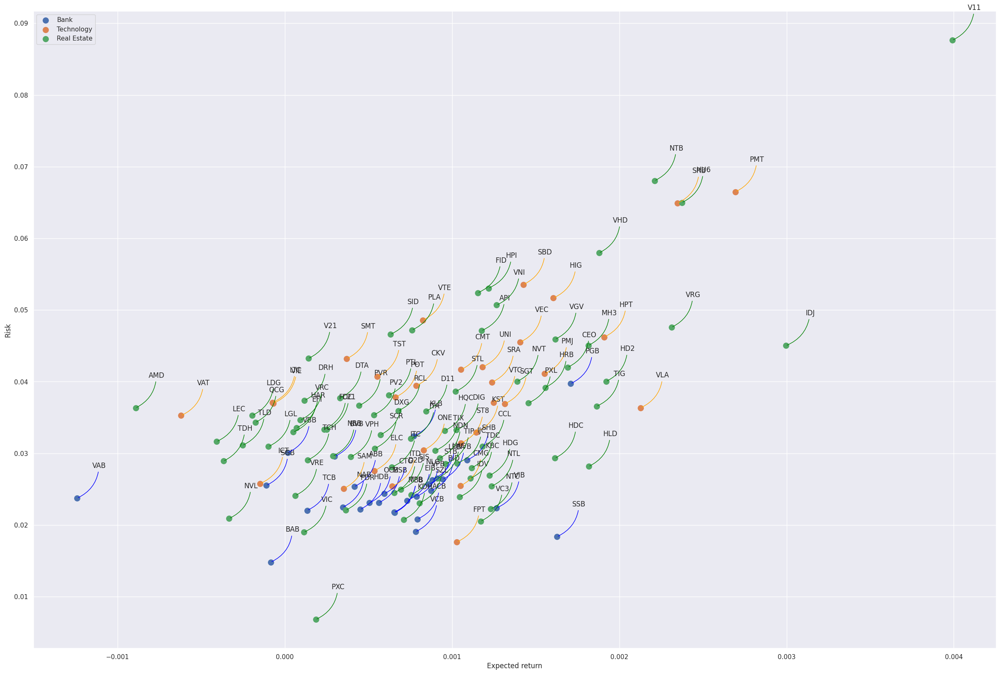

In [31]:
area = np.pi * 30

plt.figure(figsize=(30, 20))
plt.scatter(bankDR.mean(), bankDR.std(), s=area, label = "Bank")
plt.scatter(techDR.mean(), techDR.std(), s=area, label = "Technology")
plt.scatter(REDR.mean(), REDR.std(), s=area, label = "Real Estate")
plt.legend()
plt.xlabel('Expected return')
plt.ylabel('Risk')

for label, x, y in zip(bankDR.columns, bankDR.mean(), bankDR.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))
for label, x, y in zip(techDR.columns, techDR.mean(), techDR.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='orange', connectionstyle='arc3,rad=-0.3'))
for label, x, y in zip(REDR.columns, REDR.mean(), REDR.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='green', connectionstyle='arc3,rad=-0.3'))

# First Round:

In [32]:
def choose(df):
  std_values = df.std()
  selected_columns = std_values[(std_values <= 0.025)].index
  new_df = df[selected_columns]
  expected_values = new_df.mean()
  selected_columns = expected_values[(expected_values > 0.0005)].index
  new_df = new_df[selected_columns]
  return new_df

In [33]:
RE_choose = choose(REDR)
tech_choose = choose(techDR)
bank_choose = choose(bankDR)

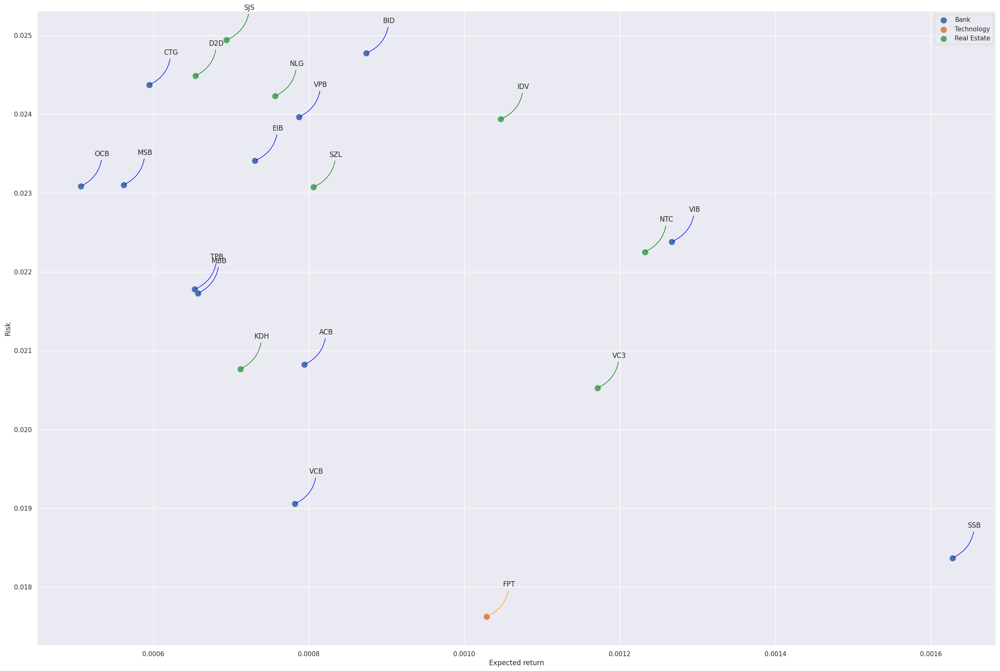

In [34]:
area = np.pi * 30

plt.figure(figsize=(30, 20))
plt.scatter(bank_choose.mean(), bank_choose.std(), s=area, label = "Bank")
plt.scatter(tech_choose.mean(), tech_choose.std(), s=area, label = "Technology")
plt.scatter(RE_choose.mean(), RE_choose.std(), s=area, label = "Real Estate")
plt.legend()
plt.xlabel('Expected return')
plt.ylabel('Risk')

for label, x, y in zip(bank_choose.columns, bank_choose.mean(), bank_choose.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='blue', connectionstyle='arc3,rad=-0.3'))
for label, x, y in zip(tech_choose.columns, tech_choose.mean(), tech_choose.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='orange', connectionstyle='arc3,rad=-0.3'))
for label, x, y in zip(RE_choose.columns, RE_choose.mean(), RE_choose.std()):
    plt.annotate(label, xy=(x, y), xytext=(50, 50), textcoords='offset points', ha='right', va='bottom', 
                 arrowprops=dict(arrowstyle='-', color='green', connectionstyle='arc3,rad=-0.3'))

In [69]:
chosen_round1 = list(tech_choose.columns) + list(RE_choose.columns) + list(bank_choose.columns)
chosen_round1

['FPT',
 'D2D',
 'IDV',
 'KDH',
 'NLG',
 'NTC',
 'SJS',
 'SZL',
 'VC3',
 'ACB',
 'BID',
 'CTG',
 'EIB',
 'MBB',
 'MSB',
 'OCB',
 'SSB',
 'TPB',
 'VCB',
 'VIB',
 'VPB']

In [70]:
# Vietnam stock information crawling
# https://github.com/thinh-vu/vnstock

!pip install vnstock

from vnstock import *### Split the dataset into time windows to get data samples.  

chosenRound1 = []

for comp in chosen_round1:
    chosen = stock_historical_data(comp, "2018-01-01", "2023-05-24")   
    chosenRound1.append(chosen)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [71]:
lstChosen = chosen_round1.copy()

# Second round:

In [76]:
for i, comp_data in enumerate(chosenRound1):
  if (comp_data["Volume"].mean() <= 200000):
    chosenRound1.pop(i)
    lstChosen.pop(i)

In [77]:
len(chosenRound1), len(lstChosen)

(16, 16)

In [78]:
lstChosen

['FPT',
 'KDH',
 'NLG',
 'VC3',
 'ACB',
 'BID',
 'CTG',
 'EIB',
 'MBB',
 'MSB',
 'OCB',
 'SSB',
 'TPB',
 'VCB',
 'VIB',
 'VPB']

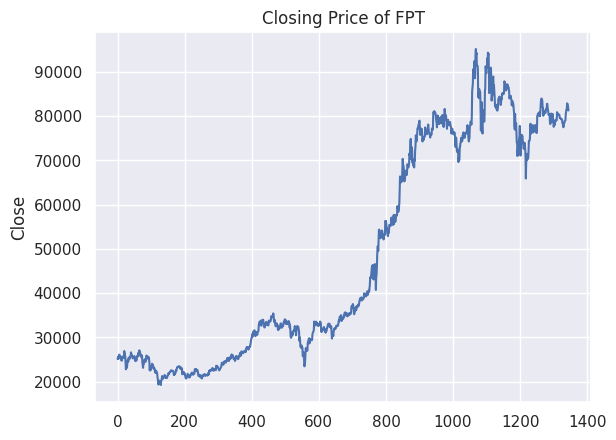

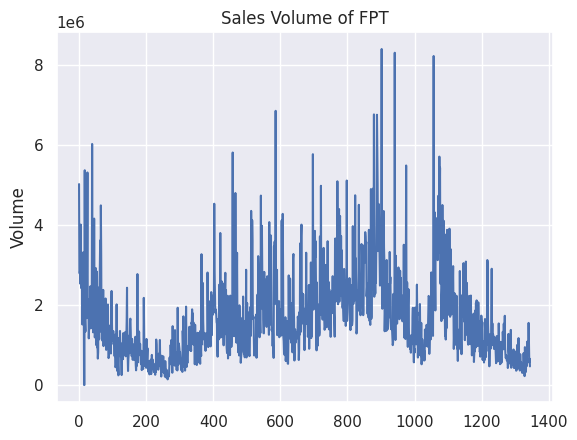

Average Volume:  1655705.8557620817


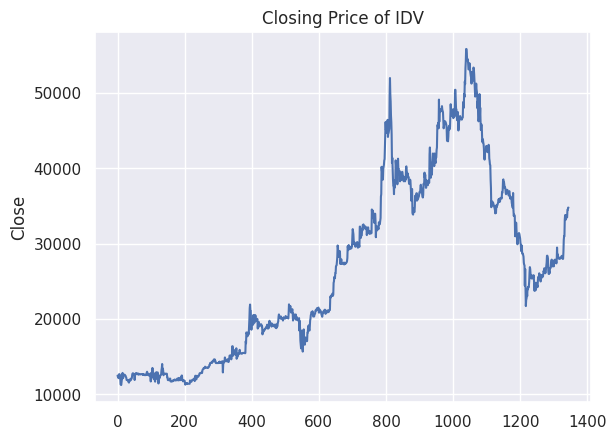

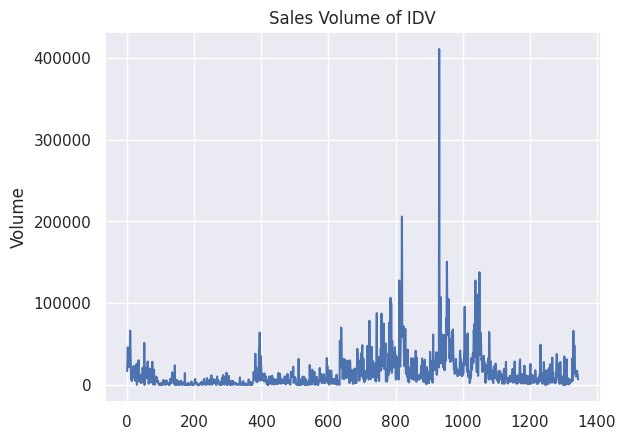

Average Volume:  14675.857249070632


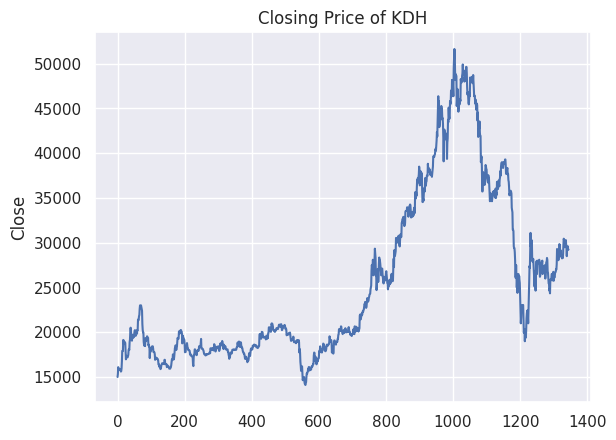

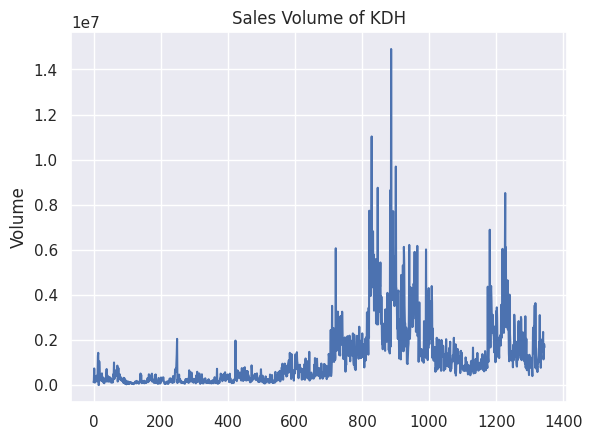

Average Volume:  1189189.0855018587


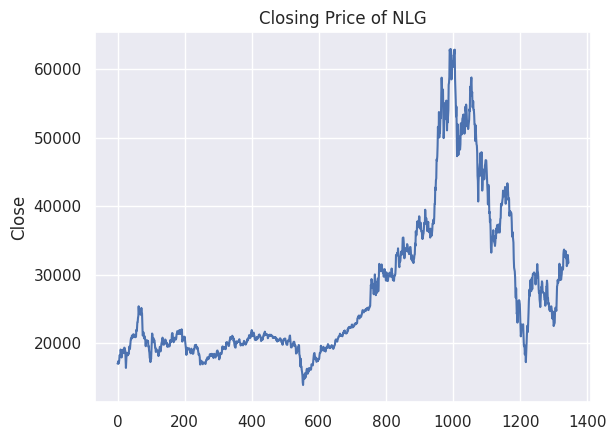

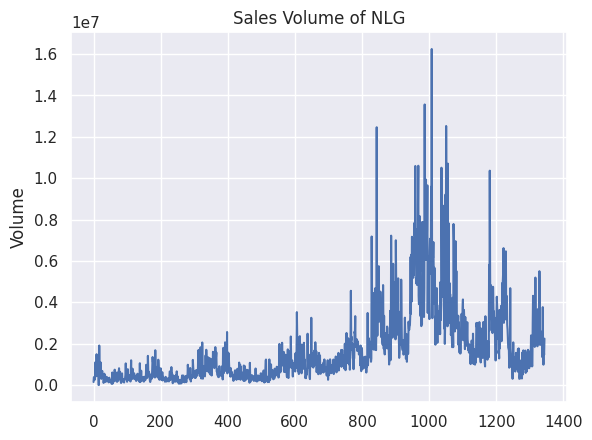

Average Volume:  1711186.0104089219


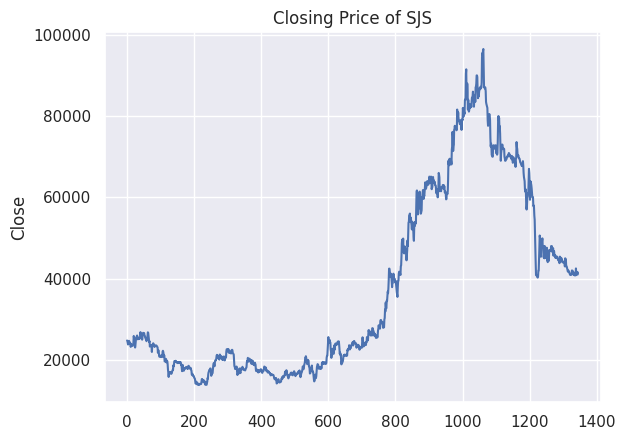

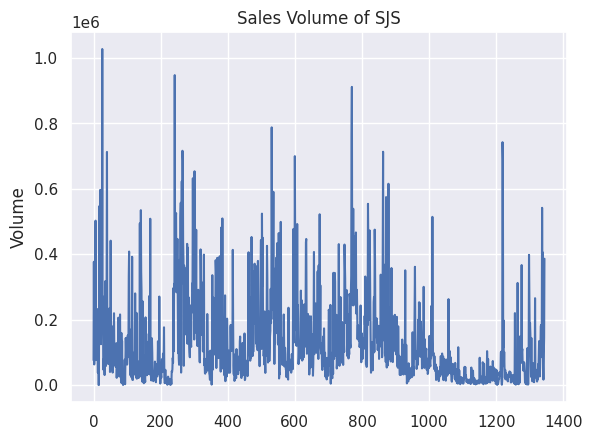

Average Volume:  131266.60223048326


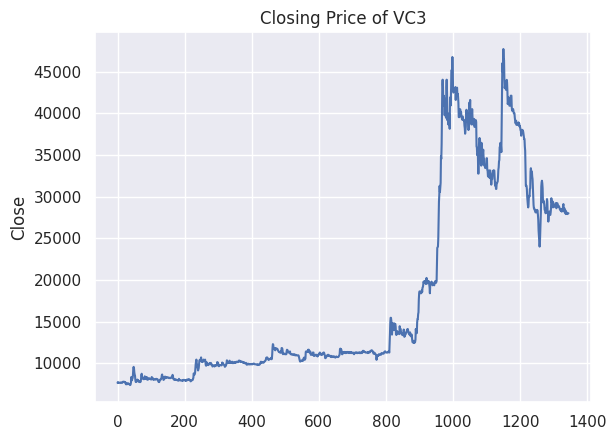

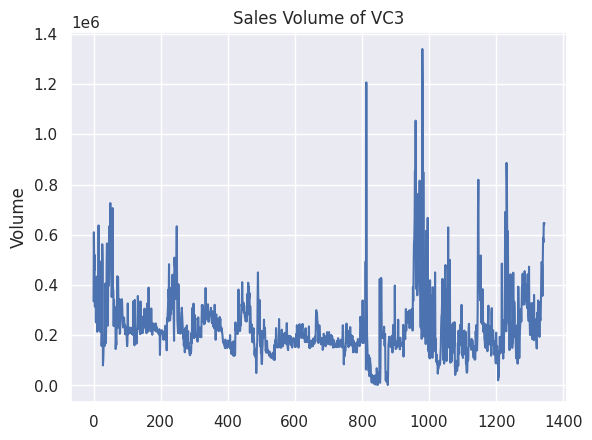

Average Volume:  232688.52267657992


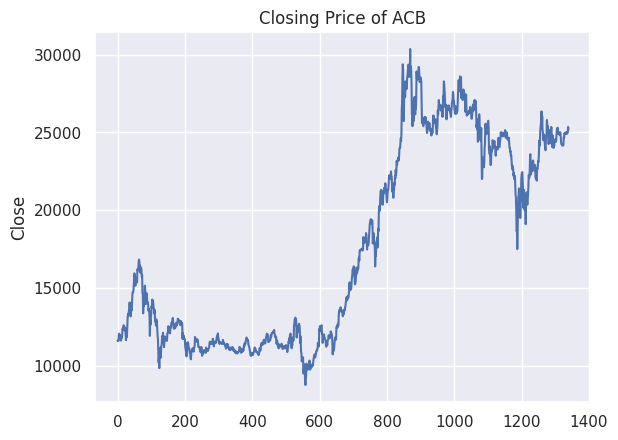

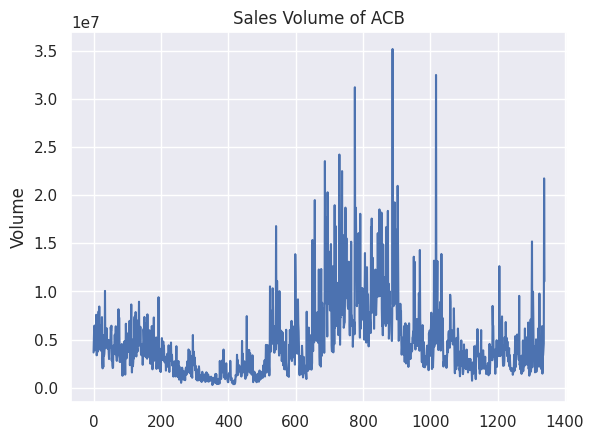

Average Volume:  4701017.296268657


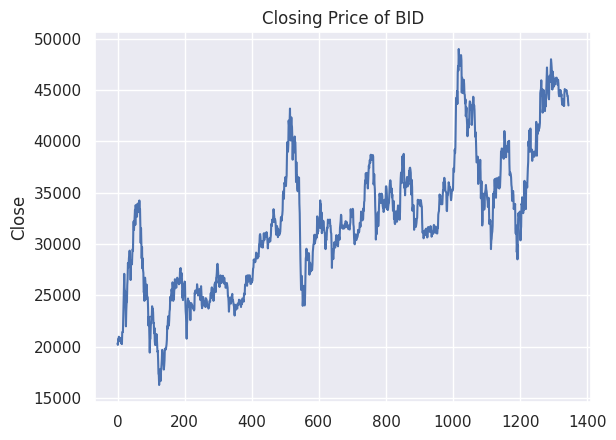

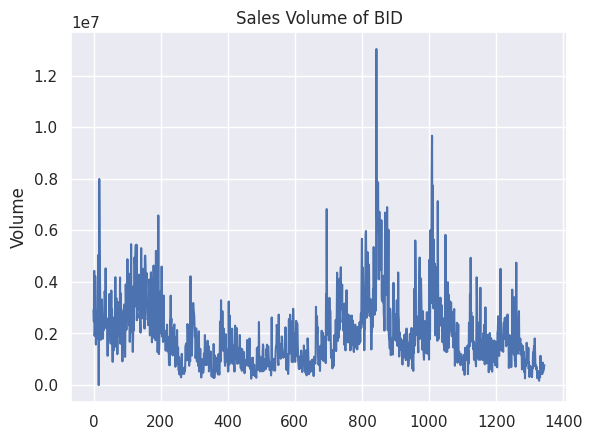

Average Volume:  1925772.4698884757


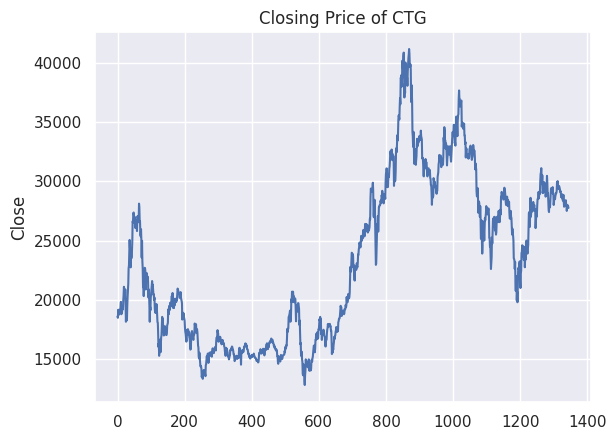

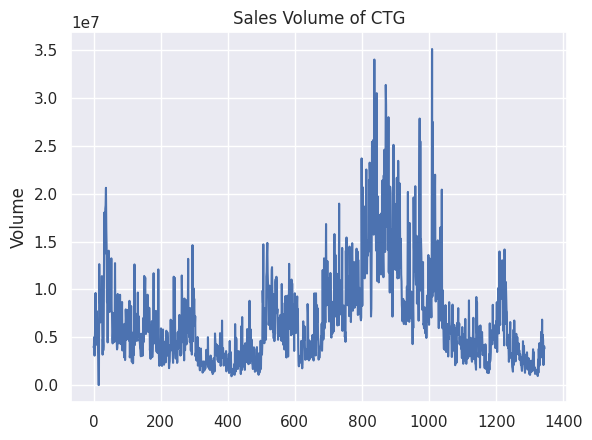

Average Volume:  6853672.572490706


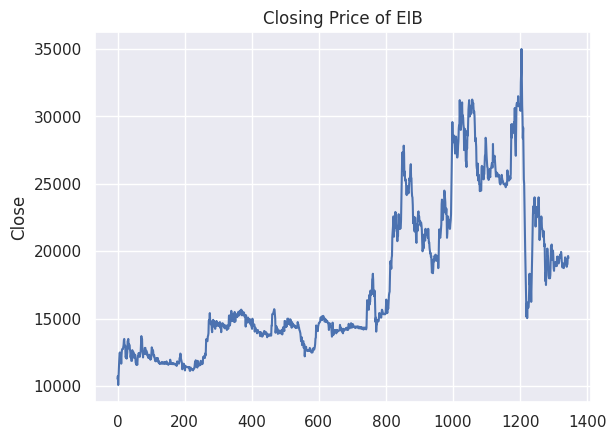

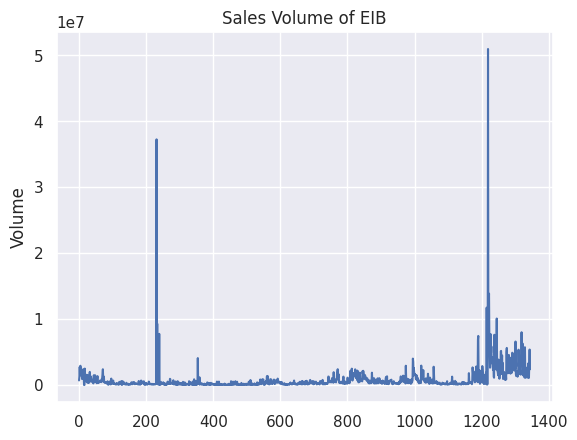

Average Volume:  802273.8208178439


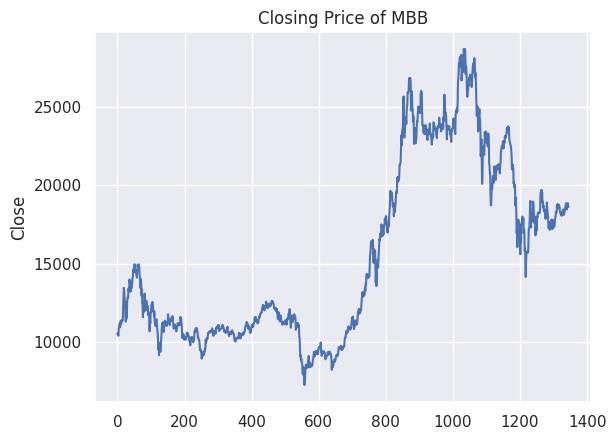

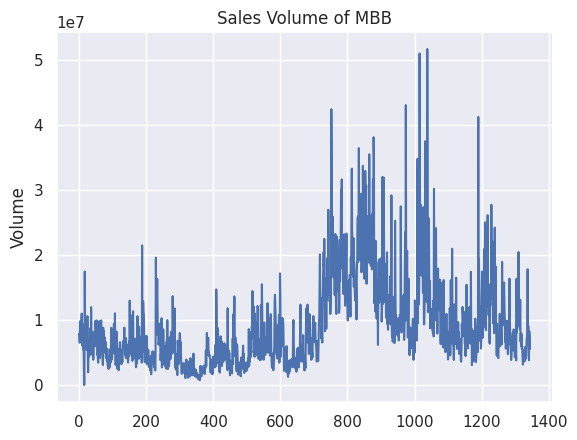

Average Volume:  9175057.257992566


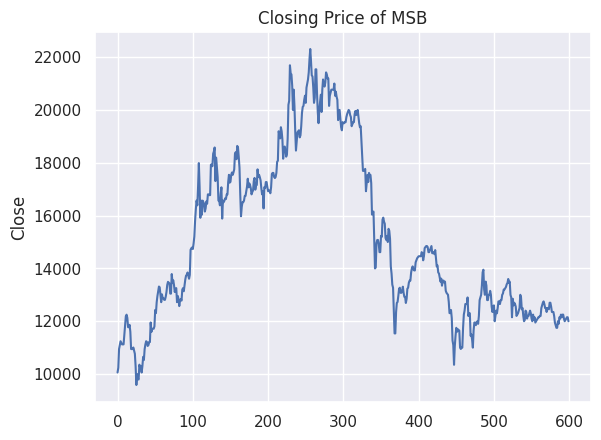

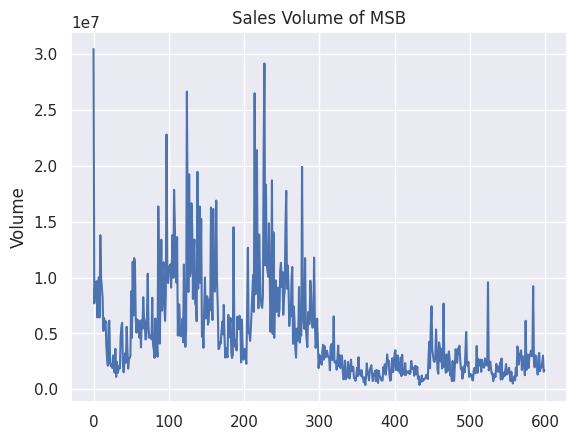

Average Volume:  4908553.573333333


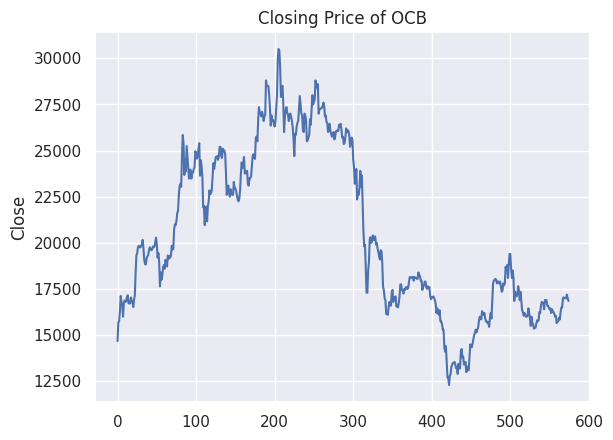

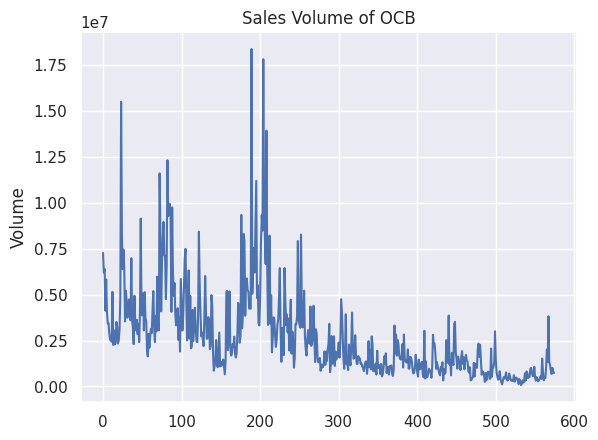

Average Volume:  2688273.3739130436


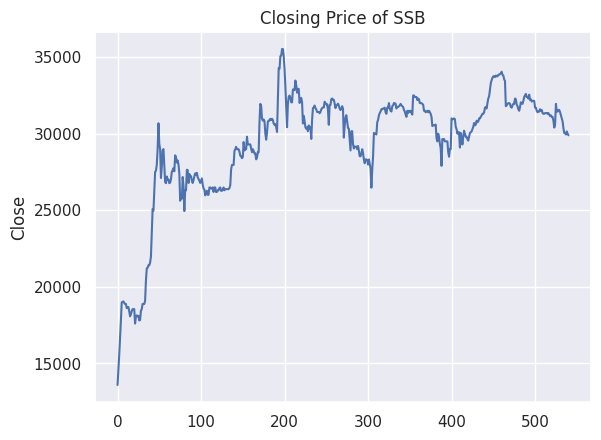

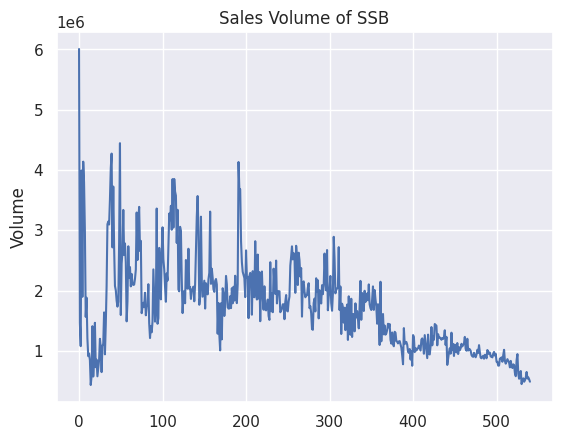

Average Volume:  1720421.0425138632


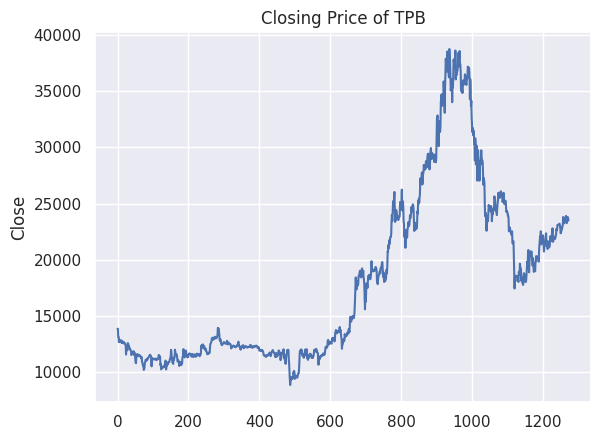

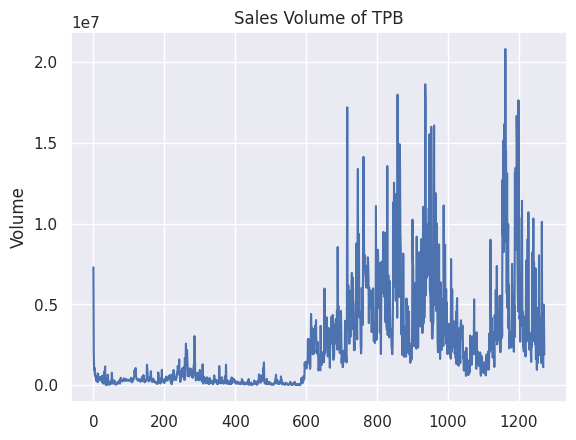

Average Volume:  2500597.2670856244


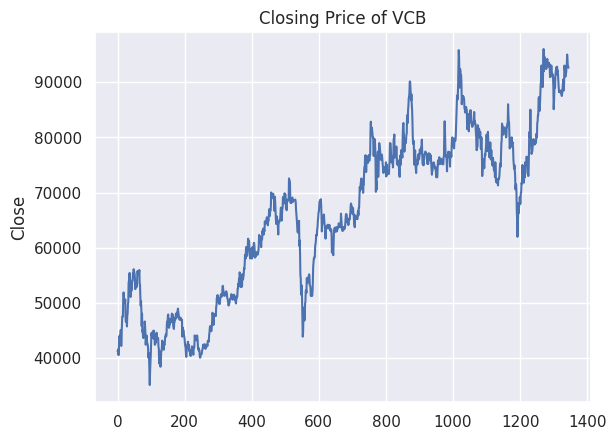

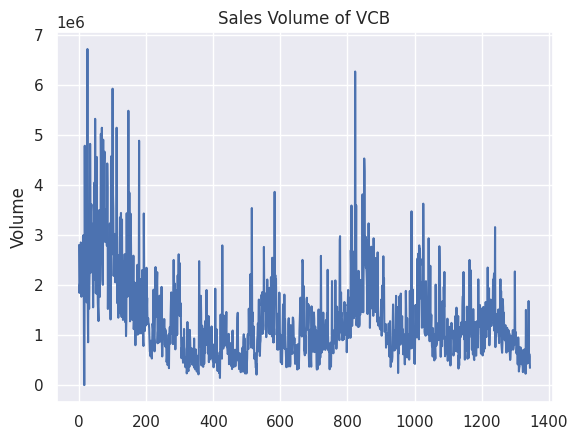

Average Volume:  1328252.1197026023


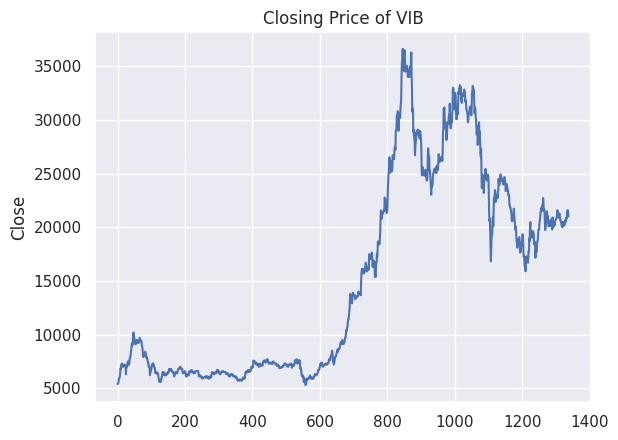

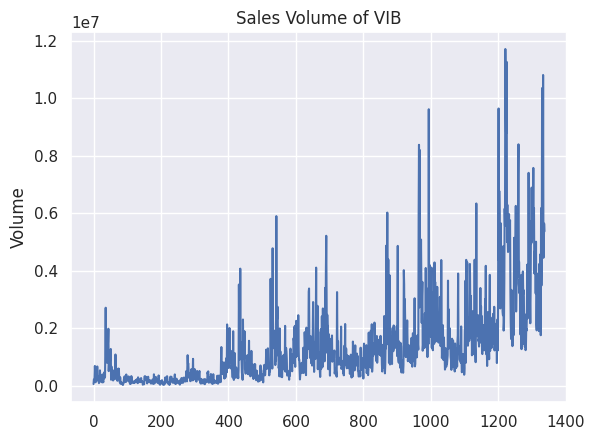

Average Volume:  1360421.6943198803


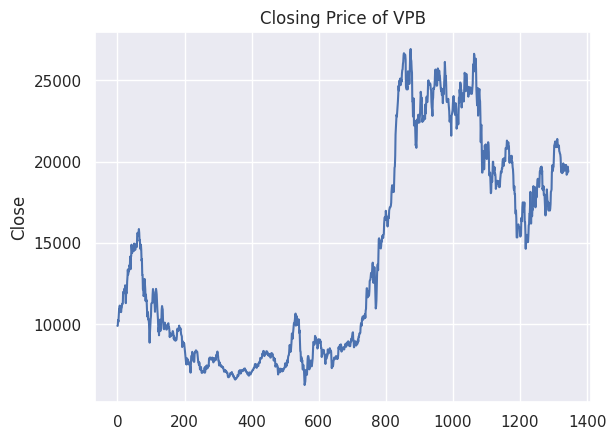

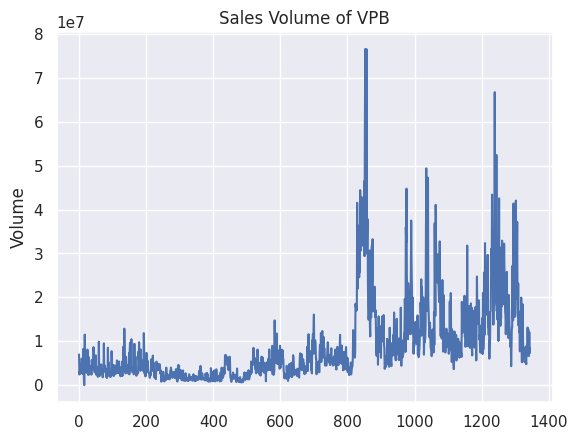

Average Volume:  8660072.513011152


<Figure size 640x480 with 0 Axes>

In [41]:
# Let's see a historical view of the closing price

# plt.subplots_adjust(top=1.25, bottom=1.2)
for i, company in enumerate(chosenRound1):
    plt.figure()
    company['Close'].plot()
    plt.ylabel('Close')
    plt.xlabel(None)
    plt.title(f"Closing Price of {lstChosen[i]}")
    plt.show()

    plt.figure()
    company['Volume'].plot()
    plt.ylabel('Volume')
    plt.xlabel(None)
    plt.title(f"Sales Volume of {lstChosen[i]}")
    plt.show()
    print("Average Volume: ", company['Volume'].mean())
plt.tight_layout()

In [79]:
### Reference: https://github.com/huseinzol05/Stock-Prediction-Models/blob/master/agent/2.moving-average-agent.ipynb
def buy_stock(
    real_movement,
    signal,
    initial_money = 1000000,
    max_buy = 1,
    max_sell = 1,
):
    """
    real_movement = actual movement in the real world
    delay = how much interval you want to delay to change our decision from buy to sell, vice versa
    initial_state = 1 is buy, 0 is sell
    initial_money = 1000, ignore what kind of currency
    max_buy = max quantity for share to buy
    max_sell = max quantity for share to sell
    """
    starting_money = initial_money
    states_sell = []
    states_buy = []
    current_inventory = 0

    def buy(i, initial_money, current_inventory):
        shares = initial_money // real_movement[i]
        if shares < 1:
            print(
                'day %d: total balances %f, not enough money to buy a unit price %f'
                % (i, initial_money, real_movement[i])
            )
        else:
            if shares > max_buy:
                buy_units = max_buy
            else:
                buy_units = shares
            initial_money -= buy_units * real_movement[i]
            current_inventory += buy_units
            print(
                'day %d: buy %d units at price %f, total balance %f'
                % (i, buy_units, buy_units * real_movement[i], initial_money)
            )
            states_buy.append(0)
        return initial_money, current_inventory

    for i in range(real_movement.shape[0] - int(0.025 * len(comp))):
        state = signal[i]
        if state == 1:
            initial_money, current_inventory = buy(
                i, initial_money, current_inventory
            )
            states_buy.append(i)
        elif state == -1:
            if current_inventory == 0:
                    print('day %d: cannot sell anything, inventory 0' % (i))
            else:
                if current_inventory > max_sell:
                    sell_units = max_sell
                else:
                    sell_units = current_inventory
                current_inventory -= sell_units
                total_sell = sell_units * real_movement[i]
                initial_money += total_sell
                try:
                    invest = (
                        (real_movement[i] - real_movement[states_buy[-1]])
                        / real_movement[states_buy[-1]]
                    ) * 100
                except:
                    invest = 0
                print(
                    'day %d, sell %d units at price %f, investment %f %%, total balance %f,'
                    % (i, sell_units, total_sell, invest, initial_money)
                )
            states_sell.append(i)
    invest = ((initial_money - starting_money) / starting_money) * 100
    total_gains = initial_money - starting_money
    return states_buy, states_sell, total_gains, invest

In [95]:
portfolio = pd.DataFrame()

In [96]:
for i, comp in enumerate(chosenRound1):
  portfolio.loc[i, 'company name'] = lstChosen[i]
  comp['50days'] = comp["Close"].rolling(100).mean()
  comp['200days'] = comp["Close"].rolling(200).mean()

  plt.plot(comp['TradingDate'], comp['Close'], label = 'Close')
  plt.plot(comp['TradingDate'], comp['50days'], label = '50 days SMA')
  plt.plot(comp['TradingDate'], comp['200days'], label = '200 days SMA')
  plt.legend()
  plt.show()

  comp['signal'] = 0
  comp['signal'][50:] = np.where(comp['50days'][50:] 
                                              > comp['200days'][50:], 1.0, 0.0)   
  comp['positions'] = comp['signal'].diff()

  states_buy, states_sell, total_gains, invest = buy_stock(comp.Close, comp['positions'])
  
  portfolio.loc[i, 'total gain'] = total_gains
  portfolio.loc[i, 'invest'] = invest

  close = comp['Close']
  fig = plt.figure(figsize = (15,5))
  plt.plot(close, color='r', lw=2.)
  plt.plot(close, '^', markersize=10, color='m', label = 'buying signal', markevery = states_buy)
  plt.plot(close, 'v', markersize=10, color='k', label = 'selling signal', markevery = states_sell)
  plt.title('total gains %f, total investment %f%%'%(total_gains, invest))

  plt.legend()
  plt.show()

Output hidden; open in https://colab.research.google.com to view.

In [97]:
portfolio.rename(columns = {'invest': 'invest (%)'}, inplace =True)

In [98]:
portfolio

,company name,total gain,invest (%)
0,FPT,45545.0,4.5545
1,KDH,12884.0,1.2884
2,NLG,10492.0,1.0492
3,VC3,10867.0,1.0867
4,ACB,-17026.0,-1.7026
5,BID,-47077.0,-4.7077
6,CTG,-19795.0,-1.9795
7,EIB,791.0,0.0791
8,MBB,7014.0,0.7014
9,MSB,-3000.0,-0.3000


In [100]:
portfolio = portfolio[portfolio['company name'] != 'EIB']

In [112]:
portfolio.sort_values(['invest (%)'], ascending = False, inplace=True)

In [113]:
portfolio.reset_index(inplace=True)
del portfolio['index']

In [114]:
portfolio

,company name,total gain,invest (%)
0,FPT,45545.0,4.5545
1,KDH,12884.0,1.2884
2,TPB,12446.0,1.2446
3,VC3,10867.0,1.0867
4,NLG,10492.0,1.0492
5,VIB,9942.0,0.9942
6,VPB,8972.0,0.8972
7,MBB,7014.0,0.7014
8,MSB,-3000.0,-0.3000
9,ACB,-17026.0,-1.7026
